# Projeto de Big Data

**Uma solução de machine learning utilizando ferramentas de big data**
 
 Este projeto tem como objetivo a prática dos principais conceitos vistos em sala de aula em uma aplicação de data science
* Escolha uma base de dados (externa ou disponível no databricks-datasets)
* Descreva a base de dados e onde está inserida no seu cluster
* Foi necessário uso do DBFS? Porque e com quais objetivos?
* Leitura da base de dados no Spark. Você utilizou o spark SQL, RDD ou dataframe?
* Realize os préprocessamentos necessários na base para utilização de um algoritmo de machine learning. Cite os pre processamentos realizados e porque foram escolhidos dessa forma _OBS. Maior quantidade de pré-processamentos possíveis diretamente no spark ao invés do pandas_
* Realize análise exploratória simples utilizando o matplotlib ou o seaborn
* Escolha um algorimto de machine learning e realize o treinamento e teste do modelo, ilustrando o desempenho e diagnóstico do modelo

## Verificando meus arquivos

Para realizar o acesso aos arquivos e algumas manipulações usarei o DBFS, como:
- Acessar o meu diretório
- Acessar os datasets  do databrick
- Fazer a cópia de uma dataset para uma pasta minha

In [0]:
dbutils.fs.ls('/')

Out[1]: [FileInfo(path='dbfs:/FileStore/', name='FileStore/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/', name='databricks-datasets/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-results/', name='databricks-results/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/letsCode/', name='letsCode/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/tmp/', name='tmp/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/user/', name='user/', size=0, modificationTime=0)]

vou continuar utilizando a minha pasta letsCode, para os armazenamento dos meus dados <br>
Agora vou verificar o que já tenho dentro dessa pasta

In [0]:
%python
dbutils.fs.ls('letsCode')

Out[2]: [FileInfo(path='dbfs:/letsCode/covid/', name='covid/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/letsCode/usuarios/', name='usuarios/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/letsCode/usuarios2/', name='usuarios2/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/letsCode/vinhos/', name='vinhos/', size=0, modificationTime=0)]

## Acessando, analisando e copiando os dados do databricks

Para este trabalho escolhi utilizar uma base de dados disponiveis na base do databricks <br>
Além disso, a intenção é utilizar uma base que eu nunca tenha mexido, para ter um melhor aprendizado dos comandos de exploração dos dados. De froma geral, realizarei os seguintes passos:

- listar todos os datasets 
- fazer uma análise do conteúdo de alguns deles
- fazer a criação de uma pasta no meu diretório
- fazer a cópia do dataset escolhido

In [0]:
# listando os datasets
dbutils.fs.ls('/databricks-datasets')

Out[3]: [FileInfo(path='dbfs:/databricks-datasets/', name='databricks-datasets/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/COVID/', name='COVID/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/README.md', name='README.md', size=976, modificationTime=1532468253000),
 FileInfo(path='dbfs:/databricks-datasets/Rdatasets/', name='Rdatasets/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/SPARK_README.md', name='SPARK_README.md', size=3359, modificationTime=1455043490000),
 FileInfo(path='dbfs:/databricks-datasets/adult/', name='adult/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/airlines/', name='airlines/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/amazon/', name='amazon/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/asa/', name='asa/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/atlas_higgs/', name='a

In [0]:
# analisando os datasetes
dbutils.fs.ls('/databricks-datasets/COVID')

Out[4]: [FileInfo(path='dbfs:/databricks-datasets/COVID/.DS_Store', name='.DS_Store', size=6148, modificationTime=1615608421000),
 FileInfo(path='dbfs:/databricks-datasets/COVID/CORD-19/', name='CORD-19/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/COVID/CSSEGISandData/', name='CSSEGISandData/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/COVID/ESRI_hospital_beds/', name='ESRI_hospital_beds/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/COVID/IHME/', name='IHME/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/COVID/USAFacts/', name='USAFacts/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/COVID/coronavirusdataset/', name='coronavirusdataset/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/COVID/covid-19-data/', name='covid-19-data/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/databricks-datasets/COVID/download_daily_covid-

In [0]:
dbutils.fs.ls('/databricks-datasets/COVID/coronavirusdataset')

Out[5]: [FileInfo(path='dbfs:/databricks-datasets/COVID/coronavirusdataset/.DS_Store', name='.DS_Store', size=6148, modificationTime=1594102716000),
 FileInfo(path='dbfs:/databricks-datasets/COVID/coronavirusdataset/Case.csv', name='Case.csv', size=11711, modificationTime=1595191979000),
 FileInfo(path='dbfs:/databricks-datasets/COVID/coronavirusdataset/PatientInfo.csv', name='PatientInfo.csv', size=488859, modificationTime=1595191979000),
 FileInfo(path='dbfs:/databricks-datasets/COVID/coronavirusdataset/PatientRoute.csv', name='PatientRoute.csv', size=718510, modificationTime=1594102718000),
 FileInfo(path='dbfs:/databricks-datasets/COVID/coronavirusdataset/Policy.csv', name='Policy.csv', size=5713, modificationTime=1595191981000),
 FileInfo(path='dbfs:/databricks-datasets/COVID/coronavirusdataset/Region.csv', name='Region.csv', size=19082, modificationTime=1595191981000),
 FileInfo(path='dbfs:/databricks-datasets/COVID/coronavirusdataset/SearchTrend.csv', name='SearchTrend.csv', siz

Depois de alguns testes escolhi utilizar o dataset de casos de Covid

In [0]:
dbutils.fs.head('/databricks-datasets/COVID/coronavirusdataset/coronavirusdataset-readme.md')

Out[6]: '\ufeff==========================================\r\nCoronavirus-Dataset\r\nDataset of COVID-19 in South Korea\r\n==========================================\r\n\r\nThis data set was obtained from https://www.kaggle.com/kimjihoo/coronavirusdataset.  The source of the data is:\r\nKCDC (Korea Centers for Disease Control & Prevention) (http://www.cdc.go.kr/)\r\n\r\nDatabricks is mirroring this dataset for use with the Databricks Community Edition in the hope that it may be \r\nuseful in making progress fighting COVID-19.\r\n\r\n=========================================\r\nData Set Information\r\n=========================================\r\n\r\nKCDC (Korea Centers for Disease Control & Prevention) announces the information of COVID-19 quickly and transparently.\r\nDS4C (Data Science for COVID-19) made a structured dataset based on the report materials of KCDC and local governments.\r\n\r\nThe data has been up to date of 2020-07-13\r\n\t\r\n=========================================\r

In [0]:
 # lendo um arquivo markdoqn com o sparck
readme_file = sc.textFile('/databricks-datasets/COVID/coronavirusdataset/coronavirusdataset-readme.md')

# exibindo o arquivo md
readme_file.collect()

Out[7]: ['==========================================',
 'Coronavirus-Dataset',
 'Dataset of COVID-19 in South Korea',
 '==========================================',
 '',
 'This data set was obtained from https://www.kaggle.com/kimjihoo/coronavirusdataset.  The source of the data is:',
 'KCDC (Korea Centers for Disease Control & Prevention) (http://www.cdc.go.kr/)',
 '',
 'Databricks is mirroring this dataset for use with the Databricks Community Edition in the hope that it may be ',
 'useful in making progress fighting COVID-19.',
 '',
 '=========================================',
 'Data Set Information',
 '=========================================',
 '',
 'KCDC (Korea Centers for Disease Control & Prevention) announces the information of COVID-19 quickly and transparently.',
 'DS4C (Data Science for COVID-19) made a structured dataset based on the report materials of KCDC and local governments.',
 '',
 'The data has been up to date of 2020-07-13',
 '\t',
 '============================

Pelas informações contidas no link citado, nesses dataset temos:<br>

**1- Case Data**
- Case: Data of COVID-19 infection cases in South Korea

**2- Patient Data**
- PatientInfo: Epidemiological data of COVID-19 patients in South Korea
- PatientRoute: Route data of COVID-19 patients in South Korea 

**3- Time Series Data**
- Time: Time series data of COVID-19 status in South Korea
- TimeAge: Time series data of COVID-19 status in terms of the age in South Korea
- TimeGender: Time series data of COVID-19 status in terms of gender in South Korea
- TimeProvince: Time series data of COVID-19 status in terms of the Province in South Korea

**4- Additional Data**
- Region: Location and statistical data of the regions in South Korea
- Weather: Data of the weather in the regions of South Korea
- SearchTrend: Trend data of the keywords searched in NAVER which is one of the largest portals in South Korea
- SeoulFloating: Data of floating population in Seoul, South Korea (from SK Telecom Big Data Hub)
- Policy: Data of the government policy for COVID-19 in South Korea

**Integrações nas tabelas desse dataset**

- Cor: significa que possui propriedades semelhantes.
- Linhas solidas: significa que os valores das colunas são parcialmente compartilhados.
- Linhas pontilhadas: significam relevância fraca

![](https://user-images.githubusercontent.com/50820635/86225695-8dca0580-bbc5-11ea-9e9b-b0ca33414d8a.PNG)

**Preview de cada um desses arquivos**

In [0]:
# verificando a estrutura dos dados
dbutils.fs.head('/databricks-datasets/COVID/coronavirusdataset/Case.csv')

Out[8]: " case_id,province,city,group,infection_case,confirmed,latitude,longitude\r\n1000001,Seoul,Yongsan-gu,TRUE,Itaewon Clubs,139,37.538621,126.992652\r\n1000002,Seoul,Gwanak-gu,TRUE,Richway,119,37.48208,126.901384\r\n1000003,Seoul,Guro-gu,TRUE,Guro-gu Call Center,95,37.508163,126.884387\r\n1000004,Seoul,Yangcheon-gu,TRUE,Yangcheon Table Tennis Club,43,37.546061,126.874209\r\n1000005,Seoul,Dobong-gu,TRUE,Day Care Center,43,37.679422,127.044374\r\n1000006,Seoul,Guro-gu,TRUE,Manmin Central Church,41,37.481059,126.894343\r\n1000007,Seoul,from other city,TRUE,SMR Newly Planted Churches Group,36,-,-\r\n1000008,Seoul,Dongdaemun-gu,TRUE,Dongan Church,17,37.592888,127.056766\r\n1000009,Seoul,from other city,TRUE,Coupang Logistics Center,25,-,-\r\n1000010,Seoul,Gwanak-gu,TRUE,Wangsung Church,30,37.481735,126.930121\r\n1000011,Seoul,Eunpyeong-gu,TRUE,Eunpyeong St. Mary's Hospital,14,37.63369,126.9165\r\n1000012,Seoul,Seongdong-gu,TRUE,Seongdong-gu APT,13,37.55713,127.0403\r\n1000013,Seoul,Jon

Para uma melhor explocação do dados e verificar a necessidade de alguns filtros antes de fazer a cópia do dados para a minha pasta, vou utlizar o spark para fazer a leitura do dados

In [0]:
df_case = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/Case.csv',format="csv", sep=",", inferSchema="true", header="true")
df_case.show()

+--------+--------+---------------+-----+--------------------+---------+---------+----------+
| case_id|province|           city|group|      infection_case|confirmed| latitude| longitude|
+--------+--------+---------------+-----+--------------------+---------+---------+----------+
| 1000001|   Seoul|     Yongsan-gu| true|       Itaewon Clubs|      139|37.538621|126.992652|
| 1000002|   Seoul|      Gwanak-gu| true|             Richway|      119| 37.48208|126.901384|
| 1000003|   Seoul|        Guro-gu| true| Guro-gu Call Center|       95|37.508163|126.884387|
| 1000004|   Seoul|   Yangcheon-gu| true|Yangcheon Table T...|       43|37.546061|126.874209|
| 1000005|   Seoul|      Dobong-gu| true|     Day Care Center|       43|37.679422|127.044374|
| 1000006|   Seoul|        Guro-gu| true|Manmin Central Ch...|       41|37.481059|126.894343|
| 1000007|   Seoul|from other city| true|SMR Newly Planted...|       36|        -|         -|
| 1000008|   Seoul|  Dongdaemun-gu| true|       Dongan Churc

In [0]:
df_PatientInfo = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/PatientInfo.csv',format="csv", sep=",", inferSchema="true", header="true")
df_PatientInfo.show()

+----------+------+---+-------+--------+------------+--------------------+-----------+--------------+------------------+-------------------+-------------------+-------------+--------+
|patient_id|   sex|age|country|province|        city|      infection_case|infected_by|contact_number|symptom_onset_date|     confirmed_date|      released_date|deceased_date|   state|
+----------+------+---+-------+--------+------------+--------------------+-----------+--------------+------------------+-------------------+-------------------+-------------+--------+
|1000000001|  male|50s|  Korea|   Seoul|  Gangseo-gu|     overseas inflow|       null|            75|        2020-01-22|2020-01-23 00:00:00|2020-02-05 00:00:00|         null|released|
|1000000002|  male|30s|  Korea|   Seoul| Jungnang-gu|     overseas inflow|       null|            31|              null|2020-01-30 00:00:00|2020-03-02 00:00:00|         null|released|
|1000000003|  male|50s|  Korea|   Seoul|   Jongno-gu|contact with patient| 20020

In [0]:
df_PatientRoute = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/PatientRoute.csv',format="csv", sep=",", inferSchema="true", header="true")
df_PatientRoute.show()

+----------+-------------------+-----------+-------------+--------------------+--------+---------+
|patient_id|               date|   province|         city|                type|latitude|longitude|
+----------+-------------------+-----------+-------------+--------------------+--------+---------+
|1000000001|2020-01-22 00:00:00|Gyeonggi-do|     Gimpo-si|             airport|37.61525| 126.7156|
|1000000001|2020-01-24 00:00:00|      Seoul|      Jung-gu|            hospital|37.56724| 127.0057|
|1000000002|2020-01-25 00:00:00|      Seoul|  Seongbuk-gu|                 etc|37.59256|  127.017|
|1000000002|2020-01-26 00:00:00|      Seoul|  Seongbuk-gu|               store|37.59181| 127.0168|
|1000000002|2020-01-26 00:00:00|      Seoul| Seongdong-gu|public_transporta...|37.56399| 127.0295|
|1000000002|2020-01-26 00:00:00|      Seoul|  Seongbuk-gu|public_transporta...|37.59033| 127.0152|
|1000000002|2020-01-26 00:00:00|      Seoul|  Seongbuk-gu|               store|37.58959| 127.0098|
|100000000

In [0]:
df_Policy = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/Policy.csv',format="csv", sep=",", inferSchema="true", header="true")
df_Policy.show()

+---------+-------+-----------+--------------------+--------------------+-------------------+-------------------+
|policy_id|country|       type|          gov_policy|              detail|         start_date|           end_date|
+---------+-------+-----------+--------------------+--------------------+-------------------+-------------------+
|        1|  Korea|      Alert|Infectious Diseas...|      Level 1 (Blue)|2020-01-03 00:00:00|2020-01-19 00:00:00|
|        2|  Korea|      Alert|Infectious Diseas...|    Level 2 (Yellow)|2020-01-20 00:00:00|2020-01-27 00:00:00|
|        3|  Korea|      Alert|Infectious Diseas...|    Level 3 (Orange)|2020-01-28 00:00:00|2020-02-22 00:00:00|
|        4|  Korea|      Alert|Infectious Diseas...|       Level 4 (Red)|2020-02-23 00:00:00|               null|
|        5|  Korea|Immigration|Special Immigrati...|          from China|2020-02-04 00:00:00|               null|
|        6|  Korea|Immigration|Special Immigrati...|      from Hong Kong|2020-02-12 00:0

In [0]:
df_Region = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/Region.csv',format="csv", sep=",", inferSchema="true", header="true")
df_Region.show()

+-----+--------+-------------+---------+----------+-----------------------+------------------+----------------+-------------+------------------------+-------------------+------------------+
| code|province|         city| latitude| longitude|elementary_school_count|kindergarten_count|university_count|academy_ratio|elderly_population_ratio|elderly_alone_ratio|nursing_home_count|
+-----+--------+-------------+---------+----------+-----------------------+------------------+----------------+-------------+------------------------+-------------------+------------------+
|10000|   Seoul|        Seoul|37.566953|126.977977|                    607|               830|              48|         1.44|                   15.38|                5.8|             22739|
|10010|   Seoul|   Gangnam-gu|37.518421|127.047222|                     33|                38|               0|         4.18|                   13.17|                4.3|              3088|
|10020|   Seoul|  Gangdong-gu|37.530492|127.123837

In [0]:
df_SearchTrend = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/SearchTrend.csv',format="csv", sep=",", inferSchema="true", header="true")
df_SearchTrend.show()

+-------------------+-------+-------+---------+-----------+
|               date|   cold|    flu|pneumonia|coronavirus|
+-------------------+-------+-------+---------+-----------+
|2016-01-01 00:00:00|0.11663| 0.0559|  0.15726|    0.00736|
|2016-01-02 00:00:00|0.13372|0.17135|  0.20826|     0.0089|
|2016-01-03 00:00:00|0.14917|0.22317|  0.19326|    0.00845|
|2016-01-04 00:00:00|0.17463|0.18626|  0.29008|    0.01145|
|2016-01-05 00:00:00|0.17226|0.15072|  0.24562|    0.01381|
|2016-01-06 00:00:00|0.17272|0.14399|  0.25081|    0.01381|
|2016-01-07 00:00:00| 0.1739|0.12408|  0.25135|     0.0119|
|2016-01-08 00:00:00|0.16735|0.12499|  0.29044|    0.01572|
|2016-01-09 00:00:00|0.13463| 0.1019|   0.2439|    0.01036|
|2016-01-10 00:00:00|0.15135|0.33062|  0.21108|    0.00699|
|2016-01-11 00:00:00|0.18444|0.50643|  0.26353|    0.01299|
|2016-01-12 00:00:00|0.17963|0.34608|  0.21962|    0.01572|
|2016-01-13 00:00:00|0.17026|0.23244|  0.22717|    0.01163|
|2016-01-14 00:00:00|0.16535|0.40198|  0

In [0]:
df_SeoulFloating = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/SeoulFloating.csv',format="csv", sep=",", inferSchema="true", header="true")
df_SeoulFloating.show()

+-------------------+----+----------+------+--------+-------------+------+
|               date|hour|birth_year|   sex|province|         city|fp_num|
+-------------------+----+----------+------+--------+-------------+------+
|2020-01-01 00:00:00|   0|        20|female|   Seoul|    Dobong-gu| 19140|
|2020-01-01 00:00:00|   0|        20|  male|   Seoul|    Dobong-gu| 19950|
|2020-01-01 00:00:00|   0|        20|female|   Seoul|Dongdaemun-gu| 25450|
|2020-01-01 00:00:00|   0|        20|  male|   Seoul|Dongdaemun-gu| 27050|
|2020-01-01 00:00:00|   0|        20|female|   Seoul|   Dongjag-gu| 28880|
|2020-01-01 00:00:00|   0|        20|  male|   Seoul|   Dongjag-gu| 30350|
|2020-01-01 00:00:00|   0|        20|female|   Seoul| Eunpyeong-gu| 27750|
|2020-01-01 00:00:00|   0|        20|  male|   Seoul| Eunpyeong-gu| 27910|
|2020-01-01 00:00:00|   0|        20|female|   Seoul|   Gangbuk-gu| 19490|
|2020-01-01 00:00:00|   0|        20|  male|   Seoul|   Gangbuk-gu| 21940|
|2020-01-01 00:00:00|   0

In [0]:
df_Time = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/Time.csv',format="csv", sep=",", inferSchema="true", header="true")
df_Time.show()

+-------------------+----+----+--------+---------+--------+--------+
|               date|time|test|negative|confirmed|released|deceased|
+-------------------+----+----+--------+---------+--------+--------+
|2020-01-20 00:00:00|  16|   1|       0|        1|       0|       0|
|2020-01-21 00:00:00|  16|   1|       0|        1|       0|       0|
|2020-01-22 00:00:00|  16|   4|       3|        1|       0|       0|
|2020-01-23 00:00:00|  16|  22|      21|        1|       0|       0|
|2020-01-24 00:00:00|  16|  27|      25|        2|       0|       0|
|2020-01-25 00:00:00|  16|  27|      25|        2|       0|       0|
|2020-01-26 00:00:00|  16|  51|      47|        3|       0|       0|
|2020-01-27 00:00:00|  16|  61|      56|        4|       0|       0|
|2020-01-28 00:00:00|  16| 116|      97|        4|       0|       0|
|2020-01-29 00:00:00|  16| 187|     155|        4|       0|       0|
|2020-01-30 00:00:00|  16| 246|     199|        6|       0|       0|
|2020-01-31 00:00:00|  16| 312|   

In [0]:
df_TimeAge = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/TimeAge.csv',format="csv", sep=",", inferSchema="true", header="true")
df_TimeAge.show()

+-------------------+----+---+---------+--------+
|               date|time|age|confirmed|deceased|
+-------------------+----+---+---------+--------+
|2020-03-02 00:00:00|   0| 0s|       32|       0|
|2020-03-02 00:00:00|   0|10s|      169|       0|
|2020-03-02 00:00:00|   0|20s|     1235|       0|
|2020-03-02 00:00:00|   0|30s|      506|       1|
|2020-03-02 00:00:00|   0|40s|      633|       1|
|2020-03-02 00:00:00|   0|50s|      834|       5|
|2020-03-02 00:00:00|   0|60s|      530|       6|
|2020-03-02 00:00:00|   0|70s|      192|       6|
|2020-03-02 00:00:00|   0|80s|       81|       3|
|2020-03-03 00:00:00|   0| 0s|       34|       0|
|2020-03-03 00:00:00|   0|10s|      204|       0|
|2020-03-03 00:00:00|   0|20s|     1417|       0|
|2020-03-03 00:00:00|   0|30s|      578|       1|
|2020-03-03 00:00:00|   0|40s|      713|       1|
|2020-03-03 00:00:00|   0|50s|      952|       5|
|2020-03-03 00:00:00|   0|60s|      597|       7|
|2020-03-03 00:00:00|   0|70s|      224|       9|


In [0]:
df_TimeGender = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/TimeGender.csv',format="csv", sep=",", inferSchema="true", header="true")
df_TimeGender.show()

+-------------------+----+------+---------+--------+
|               date|time|   sex|confirmed|deceased|
+-------------------+----+------+---------+--------+
|2020-03-02 00:00:00|   0|  male|     1591|      13|
|2020-03-02 00:00:00|   0|female|     2621|       9|
|2020-03-03 00:00:00|   0|  male|     1810|      16|
|2020-03-03 00:00:00|   0|female|     3002|      12|
|2020-03-04 00:00:00|   0|  male|     1996|      20|
|2020-03-04 00:00:00|   0|female|     3332|      12|
|2020-03-05 00:00:00|   0|  male|     2149|      21|
|2020-03-05 00:00:00|   0|female|     3617|      14|
|2020-03-06 00:00:00|   0|  male|     2345|      25|
|2020-03-06 00:00:00|   0|female|     3939|      17|
|2020-03-07 00:00:00|   0|  male|     2522|      26|
|2020-03-07 00:00:00|   0|female|     4245|      18|
|2020-03-08 00:00:00|   0|  male|     2694|      29|
|2020-03-08 00:00:00|   0|female|     4440|      20|
|2020-03-09 00:00:00|   0|  male|     2799|      31|
|2020-03-09 00:00:00|   0|female|     4583|   

In [0]:
df_TimeProvince = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/TimeProvince.csv',format="csv", sep=",", inferSchema="true", header="true")
df_TimeProvince.show()

+-------------------+----+-----------------+---------+--------+--------+
|               date|time|         province|confirmed|released|deceased|
+-------------------+----+-----------------+---------+--------+--------+
|2020-01-20 00:00:00|  16|            Seoul|        0|       0|       0|
|2020-01-20 00:00:00|  16|            Busan|        0|       0|       0|
|2020-01-20 00:00:00|  16|            Daegu|        0|       0|       0|
|2020-01-20 00:00:00|  16|          Incheon|        1|       0|       0|
|2020-01-20 00:00:00|  16|          Gwangju|        0|       0|       0|
|2020-01-20 00:00:00|  16|          Daejeon|        0|       0|       0|
|2020-01-20 00:00:00|  16|            Ulsan|        0|       0|       0|
|2020-01-20 00:00:00|  16|           Sejong|        0|       0|       0|
|2020-01-20 00:00:00|  16|      Gyeonggi-do|        0|       0|       0|
|2020-01-20 00:00:00|  16|       Gangwon-do|        0|       0|       0|
|2020-01-20 00:00:00|  16|Chungcheongbuk-do|       

In [0]:
df_Weather = spark.read.load('/databricks-datasets/COVID/coronavirusdataset/Weather.csv',format="csv", sep=",", inferSchema="true", header="true")
df_Weather.show()

+-----+-----------------+-------------------+--------+--------+--------+-------------+--------------+-------------------+---------------------+
| code|         province|               date|avg_temp|min_temp|max_temp|precipitation|max_wind_speed|most_wind_direction|avg_relative_humidity|
+-----+-----------------+-------------------+--------+--------+--------+-------------+--------------+-------------------+---------------------+
|10000|            Seoul|2016-01-01 00:00:00|     1.2|    -3.3|     4.0|          0.0|           3.5|                 90|                 73.0|
|11000|            Busan|2016-01-01 00:00:00|     5.3|     1.1|    10.9|          0.0|           7.4|                340|                 52.1|
|12000|            Daegu|2016-01-01 00:00:00|     1.7|    -4.0|     8.0|          0.0|           3.7|                270|                 70.5|
|13000|          Gwangju|2016-01-01 00:00:00|     3.2|    -1.5|     8.1|          0.0|           2.7|                230|               

**Criando a pasta "local" e criando uma cópia dos dados**

In [0]:
dbutils.fs.mkdirs('/letsCode/covid')

Out[21]: True

In [0]:
# criando a pasta covid para armazenar os dados
dbutils.fs.ls('/letsCode')

Out[22]: [FileInfo(path='dbfs:/letsCode/covid/', name='covid/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/letsCode/usuarios/', name='usuarios/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/letsCode/usuarios2/', name='usuarios2/', size=0, modificationTime=0),
 FileInfo(path='dbfs:/letsCode/vinhos/', name='vinhos/', size=0, modificationTime=0)]

In [0]:
# Copiando os dados
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/Case.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/PatientInfo.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/PatientRoute.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/Policy.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/Region.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/SearchTrend.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/SeoulFloating.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/Time.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/TimeAge.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/TimeGender.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/TimeProvince.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/Weather.csv', '/letsCode/covid')
dbutils.fs.cp ('/databricks-datasets/COVID/coronavirusdataset/coronavirusdataset-readme.md', '/letsCode/covid')


Out[23]: True

In [0]:
dbutils.fs.ls('/letsCode/covid')

Out[24]: [FileInfo(path='dbfs:/letsCode/covid/Case.csv', name='Case.csv', size=11711, modificationTime=1653949146000),
 FileInfo(path='dbfs:/letsCode/covid/PatientInfo.csv', name='PatientInfo.csv', size=488859, modificationTime=1653949147000),
 FileInfo(path='dbfs:/letsCode/covid/PatientRoute.csv', name='PatientRoute.csv', size=718510, modificationTime=1653949148000),
 FileInfo(path='dbfs:/letsCode/covid/Policy.csv', name='Policy.csv', size=5713, modificationTime=1653949148000),
 FileInfo(path='dbfs:/letsCode/covid/Region.csv', name='Region.csv', size=19082, modificationTime=1653949149000),
 FileInfo(path='dbfs:/letsCode/covid/SearchTrend.csv', name='SearchTrend.csv', size=71722, modificationTime=1653949149000),
 FileInfo(path='dbfs:/letsCode/covid/SeoulFloating.csv', name='SeoulFloating.csv', size=49682281, modificationTime=1653949152000),
 FileInfo(path='dbfs:/letsCode/covid/Time.csv', name='Time.csv', size=6604, modificationTime=1653949153000),
 FileInfo(path='dbfs:/letsCode/covid/T

## Criando a minha planilha

Inicialmente nesse trablho serão estudas somente as tabelas Case e PatientInfo, sendo assim, serão criadas somente essas planilhas

In [0]:
%sql
create database if not exists Covid

In [0]:
%sql
use Covid

In [0]:
%sql
create external table case_tab
(
case_id int,
province string,
city string,
group string ,
infection_case string,
confirmed int,
latitude float,
longitude float
)

row format delimited 
fields terminated by ','
lines terminated by '\n'
stored as textfile

-- para pular a importação do cabeçalho
tblproperties("skip.header.line.count"="1")

location '/letsCode/covid/tabs'


In [0]:
%sql
create external table infoPaciente_tab
(
patient_id int,
sex string,
age string,
country string,
province string,
city string,
infection_case string,
infected_by int,
contact_number int,
symptom_onset_date date,
confirmed_date date,
released_date date,
deceased_date date,
state string
)

row format delimited 
fields terminated by ','
lines terminated by '\n'
stored as textfile

-- para pular a importação do cabeçalho
tblproperties("skip.header.line.count"="1")

location '/letsCode/covid/tabs2'

In [0]:
%sql
show tables

database,tableName,isTemporary
covid,case_tab,false
covid,infopaciente_tab,false


Populando as tabelas criadas

In [0]:
%sql
load data inpath '/letsCode/covid/Case.csv' into table case_tab

In [0]:
%sql
select *
from case_tab
limit 10

case_id,province,city,group,infection_case,confirmed,latitude,longitude
null,province,city,group,infection_case,null,null,null
1000001,Seoul,Yongsan-gu,TRUE,Itaewon Clubs,139,37.53862,126.99265
1000002,Seoul,Gwanak-gu,TRUE,Richway,119,37.48208,126.90138
1000003,Seoul,Guro-gu,TRUE,Guro-gu Call Center,95,37.508163,126.884384
1000004,Seoul,Yangcheon-gu,TRUE,Yangcheon Table Tennis Club,43,37.546062,126.87421
1000005,Seoul,Dobong-gu,TRUE,Day Care Center,43,37.67942,127.04437
1000006,Seoul,Guro-gu,TRUE,Manmin Central Church,41,37.48106,126.89434
1000007,Seoul,from other city,TRUE,SMR Newly Planted Churches Group,36,null,null
1000008,Seoul,Dongdaemun-gu,TRUE,Dongan Church,17,37.592888,127.05676
1000009,Seoul,from other city,TRUE,Coupang Logistics Center,25,null,null


In [0]:
%sql
load data inpath '/letsCode/covid/PatientInfo.csv' into table infoPaciente_tab

In [0]:
%sql
select *
from infoPaciente_tab
limit 10

patient_id,sex,age,country,province,city,infection_case,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state
null,sex,age,country,province,city,infection_case,null,null,null,null,null,null,state
1000000001,male,50s,Korea,Seoul,Gangseo-gu,overseas inflow,null,75,2020-01-22,2020-01-23,2020-02-05,null,released
1000000002,male,30s,Korea,Seoul,Jungnang-gu,overseas inflow,null,31,null,2020-01-30,2020-03-02,null,released
1000000003,male,50s,Korea,Seoul,Jongno-gu,contact with patient,2002000001,17,null,2020-01-30,2020-02-19,null,released
1000000004,male,20s,Korea,Seoul,Mapo-gu,overseas inflow,null,9,2020-01-26,2020-01-30,2020-02-15,null,released
1000000005,female,20s,Korea,Seoul,Seongbuk-gu,contact with patient,1000000002,2,null,2020-01-31,2020-02-24,null,released
1000000006,female,50s,Korea,Seoul,Jongno-gu,contact with patient,1000000003,43,null,2020-01-31,2020-02-19,null,released
1000000007,male,20s,Korea,Seoul,Jongno-gu,contact with patient,1000000003,0,null,2020-01-31,2020-02-10,null,released
1000000008,male,20s,Korea,Seoul,etc,overseas inflow,null,0,null,2020-02-02,2020-02-24,null,released
1000000009,male,30s,Korea,Seoul,Songpa-gu,overseas inflow,null,68,null,2020-02-05,2020-02-21,null,released


In [0]:
dbutils.fs.ls('/letsCode/covid/tabs')

Out[25]: [FileInfo(path='dbfs:/letsCode/covid/tabs/Case.csv', name='Case.csv', size=11711, modificationTime=1653764484000),
 FileInfo(path='dbfs:/letsCode/covid/tabs/Case_copy_1.csv', name='Case_copy_1.csv', size=11711, modificationTime=1653846038000),
 FileInfo(path='dbfs:/letsCode/covid/tabs/Case_copy_2.csv', name='Case_copy_2.csv', size=11711, modificationTime=1653949161000),
 FileInfo(path='dbfs:/letsCode/covid/tabs/PatientInfo.csv', name='PatientInfo.csv', size=488859, modificationTime=1653764780000),
 FileInfo(path='dbfs:/letsCode/covid/tabs/PatientInfo_copy_1.csv', name='PatientInfo_copy_1.csv', size=488859, modificationTime=1653765597000)]

In [0]:
dbutils.fs.ls('/letsCode/covid/tabs2')

Out[26]: [FileInfo(path='dbfs:/letsCode/covid/tabs2/PatientInfo.csv', name='PatientInfo.csv', size=488859, modificationTime=1653765833000),
 FileInfo(path='dbfs:/letsCode/covid/tabs2/PatientInfo_copy_1.csv', name='PatientInfo_copy_1.csv', size=488859, modificationTime=1653846042000),
 FileInfo(path='dbfs:/letsCode/covid/tabs2/PatientInfo_copy_2.csv', name='PatientInfo_copy_2.csv', size=488859, modificationTime=1653949165000)]

# Uso do PySpark

In [0]:
# importanto o módulo do hive no pyspark
from pyspark import HiveContext

# criando o contexto: chamando o módulo do hive para fazer integração
# comunicação
contexto = HiveContext (sc)

/databricks/spark/python/pyspark/sql/context.py:622: FutureWarning: HiveContext is deprecated in Spark 2.0.0. Please use SparkSession.builder.enableHiveSupport().getOrCreate() instead.
  warnings.warn(


In [0]:
%sql

-- verificando onde estam a tabela
show tables

database,tableName,isTemporary
covid,case_tab,false
covid,infopaciente_tab,false


In [0]:
# chamando a tabela que está no hive
banco_case = contexto.table('case_tab')
banco_paciente = contexto.table('infopaciente_tab')

In [0]:
#lendo o banco  
banco_case.show()

+-------+--------+---------------+-----+--------------------+---------+---------+----------+
|case_id|province|           city|group|      infection_case|confirmed| latitude| longitude|
+-------+--------+---------------+-----+--------------------+---------+---------+----------+
|   null|province|           city|group|      infection_case|     null|     null|      null|
|1000001|   Seoul|     Yongsan-gu| TRUE|       Itaewon Clubs|      139| 37.53862| 126.99265|
|1000002|   Seoul|      Gwanak-gu| TRUE|             Richway|      119| 37.48208| 126.90138|
|1000003|   Seoul|        Guro-gu| TRUE| Guro-gu Call Center|       95|37.508163|126.884384|
|1000004|   Seoul|   Yangcheon-gu| TRUE|Yangcheon Table T...|       43|37.546062| 126.87421|
|1000005|   Seoul|      Dobong-gu| TRUE|     Day Care Center|       43| 37.67942| 127.04437|
|1000006|   Seoul|        Guro-gu| TRUE|Manmin Central Ch...|       41| 37.48106| 126.89434|
|1000007|   Seoul|from other city| TRUE|SMR Newly Planted...|       36

In [0]:
banco_paciente.show()

+----------+------+---+-------+--------+------------+--------------------+-----------+--------------+------------------+--------------+-------------+-------------+--------+
|patient_id|   sex|age|country|province|        city|      infection_case|infected_by|contact_number|symptom_onset_date|confirmed_date|released_date|deceased_date|   state|
+----------+------+---+-------+--------+------------+--------------------+-----------+--------------+------------------+--------------+-------------+-------------+--------+
|      null|   sex|age|country|province|        city|      infection_case|       null|          null|              null|          null|         null|         null|   state|
|1000000001|  male|50s|  Korea|   Seoul|  Gangseo-gu|     overseas inflow|       null|            75|        2020-01-22|    2020-01-23|   2020-02-05|         null|released|
|1000000002|  male|30s|  Korea|   Seoul| Jungnang-gu|     overseas inflow|       null|            31|              null|    2020-01-30|

In [0]:
# registrando  a tabela no spark

banco_case.registerTempTable('caseInfo')
banco_paciente.registerTempTable('pacienteInfo')

/databricks/spark/python/pyspark/sql/dataframe.py:146: FutureWarning: Deprecated in 2.0, use createOrReplaceTempView instead.
  warnings.warn(


In [0]:
# verificando o schema das duas tabelas
banco_case.printSchema()
banco_paciente.printSchema()


root
 |-- case_id: integer (nullable = true)
 |-- province: string (nullable = true)
 |-- city: string (nullable = true)
 |-- group: string (nullable = true)
 |-- infection_case: string (nullable = true)
 |-- confirmed: integer (nullable = true)
 |-- latitude: float (nullable = true)
 |-- longitude: float (nullable = true)

root
 |-- patient_id: integer (nullable = true)
 |-- sex: string (nullable = true)
 |-- age: string (nullable = true)
 |-- country: string (nullable = true)
 |-- province: string (nullable = true)
 |-- city: string (nullable = true)
 |-- infection_case: string (nullable = true)
 |-- infected_by: integer (nullable = true)
 |-- contact_number: integer (nullable = true)
 |-- symptom_onset_date: date (nullable = true)
 |-- confirmed_date: date (nullable = true)
 |-- released_date: date (nullable = true)
 |-- deceased_date: date (nullable = true)
 |-- state: string (nullable = true)



nota-se que ambas as tabelas possuem as colnas:
-  province
- infection_case
- city


Para esse estudo serão deletadas as colunas  province e city da tabela Case, pois segundo o diagrama, a ligação entre as duas tabelas seria em infection_case e não há a mesma quantidade de dados em ambas as tabelas e com isso haveria a perda de dados, caso eles fossem unidos com as colunas duplicadas

In [0]:
cols = ("city","province")

banco_case2 = banco_case.drop(*cols)

In [0]:
banco_case2.show()

+-------+-----+--------------------+---------+---------+----------+
|case_id|group|      infection_case|confirmed| latitude| longitude|
+-------+-----+--------------------+---------+---------+----------+
|   null|group|      infection_case|     null|     null|      null|
|1000001| TRUE|       Itaewon Clubs|      139| 37.53862| 126.99265|
|1000002| TRUE|             Richway|      119| 37.48208| 126.90138|
|1000003| TRUE| Guro-gu Call Center|       95|37.508163|126.884384|
|1000004| TRUE|Yangcheon Table T...|       43|37.546062| 126.87421|
|1000005| TRUE|     Day Care Center|       43| 37.67942| 127.04437|
|1000006| TRUE|Manmin Central Ch...|       41| 37.48106| 126.89434|
|1000007| TRUE|SMR Newly Planted...|       36|     null|      null|
|1000008| TRUE|       Dongan Church|       17|37.592888| 127.05676|
|1000009| TRUE|Coupang Logistics...|       25|     null|      null|
|1000010| TRUE|     Wangsung Church|       30|37.481735| 126.93012|
|1000011| TRUE|Eunpyeong St. Mar...|       14| 3

In [0]:
# unindo as tabelas
df = banco_paciente.join(banco_case2, ['infection_case'],how='left')

In [0]:
df.show()

+---------------+----------+----+---+-------+--------+----------+-----------+--------------+------------------+--------------+-------------+-------------+--------+-------+-----+---------+--------+---------+
| infection_case|patient_id| sex|age|country|province|      city|infected_by|contact_number|symptom_onset_date|confirmed_date|released_date|deceased_date|   state|case_id|group|confirmed|latitude|longitude|
+---------------+----------+----+---+-------+--------+----------+-----------+--------------+------------------+--------------+-------------+-------------+--------+-------+-----+---------+--------+---------+
|overseas inflow|1000000001|male|50s|  Korea|   Seoul|Gangseo-gu|       null|            75|        2020-01-22|    2020-01-23|   2020-02-05|         null|released|7000001|FALSE|       14|    null|     null|
|overseas inflow|1000000001|male|50s|  Korea|   Seoul|Gangseo-gu|       null|            75|        2020-01-22|    2020-01-23|   2020-02-05|         null|released|6100010|F

In [0]:
# uma forma de vizualização melhor
display(df)

infection_case,patient_id,sex,age,country,province,city,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state,case_id,group,confirmed,latitude,longitude
Eunpyeong St. Mary's Hospital,1000000022,male,30s,Korea,Seoul,Seodaemun-gu,null,null,null,2020-02-21,null,null,released,1000011,TRUE,14,37.63369,126.9165
Eunpyeong St. Mary's Hospital,1000000022,male,30s,Korea,Seoul,Seodaemun-gu,null,null,null,2020-02-21,null,null,released,1000011,TRUE,14,37.63369,126.9165
Eunpyeong St. Mary's Hospital,1000000022,male,30s,Korea,Seoul,Seodaemun-gu,null,null,null,2020-02-21,null,null,released,1000011,TRUE,14,37.63369,126.9165
Eunpyeong St. Mary's Hospital,1000000025,male,60s,Korea,Seoul,Gangdong-gu,1000000022,null,null,2020-02-22,null,null,released,1000011,TRUE,14,37.63369,126.9165
Eunpyeong St. Mary's Hospital,1000000025,male,60s,Korea,Seoul,Gangdong-gu,1000000022,null,null,2020-02-22,null,null,released,1000011,TRUE,14,37.63369,126.9165
Eunpyeong St. Mary's Hospital,1000000025,male,60s,Korea,Seoul,Gangdong-gu,1000000022,null,null,2020-02-22,null,null,released,1000011,TRUE,14,37.63369,126.9165
Eunpyeong St. Mary's Hospital,1000000028,female,70s,Korea,Seoul,Jongno-gu,null,null,null,2020-02-23,2020-03-11,null,released,1000011,TRUE,14,37.63369,126.9165
Eunpyeong St. Mary's Hospital,1000000028,female,70s,Korea,Seoul,Jongno-gu,null,null,null,2020-02-23,2020-03-11,null,released,1000011,TRUE,14,37.63369,126.9165
Eunpyeong St. Mary's Hospital,1000000028,female,70s,Korea,Seoul,Jongno-gu,null,null,null,2020-02-23,2020-03-11,null,released,1000011,TRUE,14,37.63369,126.9165
Eunpyeong St. Mary's Hospital,1000000029,female,20s,Korea,Seoul,Jongno-gu,1000000028,null,2020-02-11,2020-02-26,2020-03-11,null,released,1000011,TRUE,14,37.63369,126.9165


In [0]:
df.dropDuplicates()

Out[50]: DataFrame[infection_case: string, patient_id: int, sex: string, age: string, country: string, province: string, city: string, infected_by: int, contact_number: int, symptom_onset_date: date, confirmed_date: date, released_date: date, deceased_date: date, state: string, case_id: int, group: string, confirmed: int, latitude: float, longitude: float]

In [0]:
display(df.describe())

summary,infection_case,patient_id,sex,age,country,province,city,infected_by,contact_number,state,case_id,group,confirmed,latitude,longitude
count,515406,380649,515406,515406,515406,515406,515406,149859,91548,515406,512640,512649,512640,9225,9225
mean,null,1.549009448609128E9,null,null,null,null,null,1.5910652892504354E9,32787.34309870232,null,3034139.8483497193,null,80.2355863764045,37.0450673805795,127.39064527558118
stddev,null,4.4079351698245215E8,null,null,null,null,null,4.2029053536002916E8,5724423.9617442,null,1997804.325679578,null,261.5684641559311,0.7597714439012289,0.7695414485978715
min,,1000000001,,,Bangladesh,Busan,,12702,0,,1000001,FALSE,0,35.16708,126.77525
max,overseas inflow,2000001207,sex,age,country,province,sankyeock-dong,2017000005,1000000796,state,7000004,group,4511,37.67942,129.1124


Para se ter uma melhor vuzualização o ideal é utilizar o pandas. Para passar de spark para pandas usamos o comendo .toPandas() <br>

Entretanto para voltar para o spark é necessário fazer a criação do mesmo novamente, utilizando o comando spark.createDataFrame() <br>

Outra solução seria fazer um filtro e passar somente isso para o pandas a fim de ter uma melhor visualização dos dados.

E também é possivel usar o display(), que mesmo no spark a visualização é boa


Esse é o caminho que vou seguir pandas e display()

In [0]:
df_pandas = df.toPandas()
df_pandas.head()

,infection_case,patient_id,sex,age,country,province,city,infected_by,contact_number,symptom_onset_date,confirmed_date,released_date,deceased_date,state,case_id,group,confirmed,latitude,longitude
0,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Seocho-gu,NaN,NaN,None,2020-06-20,None,None,isolated,1000033.0,TRUE,2.0,NaN,NaN
1,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Seocho-gu,NaN,NaN,None,2020-06-20,None,None,isolated,1000033.0,TRUE,2.0,NaN,NaN
2,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Seocho-gu,NaN,NaN,None,2020-06-20,None,None,isolated,1000033.0,TRUE,2.0,NaN,NaN
3,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Yeongdeungpo-gu,NaN,NaN,None,2020-06-20,None,None,isolated,1000033.0,TRUE,2.0,NaN,NaN
4,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Yeongdeungpo-gu,NaN,NaN,None,2020-06-20,None,None,isolated,1000033.0,TRUE,2.0,NaN,NaN


In [0]:
# dados categóricos
df_pandas.describe(include=['O'])

,infection_case,sex,age,country,province,city,symptom_onset_date,confirmed_date,released_date,deceased_date,state,group
count,515406,515406,515406,515406,515406,515406,78960,514785,132987,3147,515406,512649
unique,53,4,13,17,18,165,128,148,130,39,5,3
top,contact with patient,female,,Korea,Gyeonggi-do,Seongnam-si,2020-02-27,2020-03-31,2020-03-18,2020-03-31,released,FALSE
freq,231840,217911,131127,510069,172875,25137,3546,11700,4299,459,266568,467919


In [0]:
#dados numéricos
df_pandas.describe()

,patient_id,infected_by,contact_number,case_id,confirmed,latitude,longitude
count,3.806490e+05,1.498590e+05,9.154800e+04,5.126400e+05,512640.000000,9225.000000,9225.000000
mean,1.549009e+09,1.591065e+09,3.278734e+04,3.034140e+06,80.235586,37.045067,127.390648
std,4.407935e+08,4.202905e+08,5.724424e+06,1.997804e+06,261.568464,0.759771,0.769541
min,1.000000e+09,1.270200e+04,0.000000e+00,1.000001e+06,0.000000,35.167080,126.775253
25%,1.000001e+09,1.200000e+09,2.000000e+00,1.400001e+06,4.000000,36.504711,126.901382
50%,1.500000e+09,1.500000e+09,4.000000e+00,2.000020e+06,14.000000,37.508163,126.992653
75%,2.000001e+09,2.000000e+09,1.400000e+01,5.000004e+06,36.000000,37.538620,127.392708
max,2.000001e+09,2.017000e+09,1.000001e+09,7.000004e+06,4511.000000,37.679420,129.112396


In [0]:
# count do spark só mostra a quantidade de linhas
df.count()

Out[51]: 515406

In [0]:
# com o len de colunas posso saber a quantidade de colunas
len(df.columns)

Out[44]: 19

Para resolver esse probelema posso danto usar o shape do pandas como criar uma função

In [0]:
# usando o shape do pandas para verificar linhas e colunas
df_pandas.shape

Out[45]: (515406, 19)

In [0]:
# criando a função de shape completa do spark
def sparkShape(dataFrame):
    return (dataFrame.count(), len(dataFrame.columns))

sparkShape(df)


Out[175]: (512028, 7)

In [0]:
#df.na()
df.na

Out[47]: <pyspark.sql.dataframe.DataFrameNaFunctions at 0x7f4865a6b610>

In [0]:
from pyspark.sql.functions import col,isnan, when, count
df.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df.columns]).show()

---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
<command-3549802698490719> in <module>
      1 from pyspark.sql.functions import col,isnan, when, count
----> 2 df.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df.columns]).show()

/databricks/spark/python/pyspark/sql/dataframe.py in select(self, *cols)
   1824         [Row(name='Alice', age=12), Row(name='Bob', age=15)]
   1825         """
-> 1826         jdf = self._jdf.select(self._jcols(*cols))
   1827         return DataFrame(jdf, self.sql_ctx)
   1828 

/databricks/spark/python/lib/py4j-0.10.9.1-src.zip/py4j/java_gateway.py in __call__(self, *args)
   1302 
   1303         answer = self.gateway_client.send_command(command)
-> 1304         return_value = get_return_value(
   1305             answer, self.gateway_client, self.target_id, self.name)
   1306 

/databricks/spark/python/pyspark/sql/utils.py in dec

In [0]:
# Find count for empty, None, Null, Nan with string literals.

df2 = df.select([count(when(col(c).contains('None') | \
                            col(c).contains('NULL') | \
                            (col(c) == '' ) | \
                            col(c).isNull() | \
                            isnan(c), c 
                           )).alias(c)
                    for c in df.columns])
df2.show()


---------------------------------------------------------------------------
AnalysisException                         Traceback (most recent call last)
<command-3791397777496487> in <module>
      1 # Find count for empty, None, Null, Nan with string literals.
      2 
----> 3 df2 = df.select([count(when(col(c).contains('None') | \
      4                             col(c).contains('NULL') | \
      5                             (col(c) == '' ) | \

/databricks/spark/python/pyspark/sql/dataframe.py in select(self, *cols)
   1824         [Row(name='Alice', age=12), Row(name='Bob', age=15)]
   1825         """
-> 1826         jdf = self._jdf.select(self._jcols(*cols))
   1827         return DataFrame(jdf, self.sql_ctx)
   1828 

/databricks/spark/python/lib/py4j-0.10.9.1-src.zip/py4j/java_gateway.py in __call__(self, *args)
   1302 
   1303         answer = self.gateway_client.send_command(command)
-> 1304         return_value = get_return_value(
   1305             answer, self.gateway

In [0]:
df.filter(df.isNull()).show()

---------------------------------------------------------------------------
AttributeError                            Traceback (most recent call last)
<command-3549802698490731> in <module>
----> 1 df.filter(df.isNull()).show()

/databricks/spark/python/pyspark/sql/dataframe.py in __getattr__(self, name)
   1798         """
   1799         if name not in self.columns:
-> 1800             raise AttributeError(
   1801                 "'%s' object has no attribute '%s'" % (self.__class__.__name__, name))
   1802         jc = self._jdf.apply(name)

AttributeError: 'DataFrame' object has no attribute 'isNull'

In [0]:
df.isnull().sum()

---------------------------------------------------------------------------
AttributeError                            Traceback (most recent call last)
<command-3549802698490740> in <module>
----> 1 df.isnull().sum()

/databricks/spark/python/pyspark/sql/dataframe.py in __getattr__(self, name)
   1798         """
   1799         if name not in self.columns:
-> 1800             raise AttributeError(
   1801                 "'%s' object has no attribute '%s'" % (self.__class__.__name__, name))
   1802         jc = self._jdf.apply(name)

AttributeError: 'DataFrame' object has no attribute 'isnull'

as funções de verificação de nulos encontradas na internet não funcionaram, sendo assim vamos para o pandas

In [0]:
((df_pandas.isnull().sum()/df_pandas.shape[0]) *100).round(2)

Out[57]: infection_case         0.00
patient_id            26.15
sex                    0.00
age                    0.00
country                0.00
province               0.00
city                   0.00
infected_by           70.92
contact_number        82.24
symptom_onset_date    84.68
confirmed_date         0.12
released_date         74.20
deceased_date         99.39
state                  0.00
case_id                0.54
group                  0.53
confirmed              0.54
latitude              98.21
longitude             98.21
dtype: float64

serão deletadas as colunas com mais de 50% de dados faltantes  e removidas as linhas com até 5% de dados nulos.

In [0]:
# removendo as colunas
df_pandas.drop(columns = ['infected_by', 'contact_number', 'symptom_onset_date', 'released_date', 'deceased_date', 'latitude', 'longitude' ], inplace=True)

In [0]:
df_pandas.head()

,infection_case,patient_id,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed
0,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
1,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
2,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
3,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Yeongdeungpo-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
4,Uiwang Logistics Center,1.000001e+09,,,Korea,Seoul,Yeongdeungpo-gu,2020-06-20,isolated,1000033.0,TRUE,2.0


In [0]:
((df_pandas.isnull().sum()/df_pandas.shape[0]) *100).round(2)

Out[60]: infection_case     0.00
patient_id        26.15
sex                0.00
age                0.00
country            0.00
province           0.00
city               0.00
confirmed_date     0.12
state              0.00
case_id            0.54
group              0.53
confirmed          0.54
dtype: float64

Antes de fazer alguma modificação na coluna de id dos pacientes, é importante verificar como estão esses dados, para montar uma estratégia de eliminação/preenchimeto

In [0]:
len(df_pandas.patient_id.unique())

Out[61]: 3420

In [0]:
df_pandas.patient_id.value_counts()

Out[62]: 1.200012e+09    306
1.000001e+09    153
1.000001e+09    153
1.600000e+09    153
2.000000e+09    153
               ... 
1.000001e+09      3
1.200000e+09      3
1.200004e+09      3
1.400000e+09      3
1.000001e+09      3
Name: patient_id, Length: 3419, dtype: int64

nota-se que o mesmo id de paciente se repete mais de uma vez, sendo assim, o ideal é remover essa coluna, pois um preenchimeto pode levar a uma falsa interpretaçãos do dados

In [0]:
df_pandas.drop(columns = ['patient_id'], inplace = True)

In [0]:
((df_pandas.isnull().sum()/df_pandas.shape[0]) *100).round(2)

Out[64]: infection_case    0.00
sex               0.00
age               0.00
country           0.00
province          0.00
city              0.00
confirmed_date    0.12
state             0.00
case_id           0.54
group             0.53
confirmed         0.54
dtype: float64

Agora, por fim, serão removidas as linhas nulas

In [0]:
df_pandas.dropna(inplace = True)
df_pandas.head(20)

,infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed
0,Uiwang Logistics Center,,,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
1,Uiwang Logistics Center,,,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
2,Uiwang Logistics Center,,,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
3,Uiwang Logistics Center,,,Korea,Seoul,Yeongdeungpo-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
4,Uiwang Logistics Center,,,Korea,Seoul,Yeongdeungpo-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
5,Uiwang Logistics Center,,,Korea,Seoul,Yeongdeungpo-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
6,Eunpyeong St. Mary's Hospital,male,30s,Korea,Seoul,Seodaemun-gu,2020-02-21,released,1000011.0,TRUE,14.0
7,Eunpyeong St. Mary's Hospital,male,30s,Korea,Seoul,Seodaemun-gu,2020-02-21,released,1000011.0,TRUE,14.0
8,Eunpyeong St. Mary's Hospital,male,30s,Korea,Seoul,Seodaemun-gu,2020-02-21,released,1000011.0,TRUE,14.0
9,Eunpyeong St. Mary's Hospital,male,60s,Korea,Seoul,Gangdong-gu,2020-02-22,released,1000011.0,TRUE,14.0


In [0]:
((df_pandas.isnull().sum()/df_pandas.shape[0]) *100).round(2)

Out[66]: infection_case    0.0
sex               0.0
age               0.0
country           0.0
province          0.0
city              0.0
confirmed_date    0.0
state             0.0
case_id           0.0
group             0.0
confirmed         0.0
dtype: float64

Aparentemente existem dados que só possuem um espaço no lugar do dados.

In [0]:
df_pandas[df_pandas['sex'] =='']


,infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed
0,Uiwang Logistics Center,,,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
1,Uiwang Logistics Center,,,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
2,Uiwang Logistics Center,,,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
3,Uiwang Logistics Center,,,Korea,Seoul,Yeongdeungpo-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
4,Uiwang Logistics Center,,,Korea,Seoul,Yeongdeungpo-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
...,...,...,...,...,...,...,...,...,...,...,...
510586,Guri Collective Infection,,,Korea,Seoul,etc,2020-05-28,isolated,1000022.0,TRUE,5.0
510587,Guri Collective Infection,,,Korea,Seoul,etc,2020-05-28,isolated,1000022.0,TRUE,5.0
510588,Guri Collective Infection,,,Korea,Seoul,Gangnam-gu,2020-05-29,released,1000022.0,TRUE,5.0
510589,Guri Collective Infection,,,Korea,Seoul,Gangnam-gu,2020-05-29,released,1000022.0,TRUE,5.0


In [0]:
df_pandas.shape

Out[68]: (512028, 11)

como são muitos dados que o sexo e a idade não foram informados, vou somente mudar o espaço em branco para "no_info".
Mas antes disso, vou voltar para o pyspark, para praticar esses comandos.

In [0]:
# tranformando o dados modificados no pandas em df spark
df2 = spark.createDataFrame(df_pandas)
df2.show()


+--------------------+------+---+-------+--------+---------------+--------------+--------+---------+-----+---------+
|      infection_case|   sex|age|country|province|           city|confirmed_date|   state|  case_id|group|confirmed|
+--------------------+------+---+-------+--------+---------------+--------------+--------+---------+-----+---------+
|Uiwang Logistics ...|      |   |  Korea|   Seoul|      Seocho-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|      |   |  Korea|   Seoul|      Seocho-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|      |   |  Korea|   Seoul|      Seocho-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|      |   |  Korea|   Seoul|Yeongdeungpo-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|      |   |  Korea|   Seoul|Yeongdeungpo-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|      |   |  Korea|   Seoul|Yeongdeungpo-g

In [0]:
sex_nulos = df2.filter(df2.sex=="")
sex_nulos.show()

+--------------------+---+---+-------+--------+---------------+--------------+--------+---------+-----+---------+
|      infection_case|sex|age|country|province|           city|confirmed_date|   state|  case_id|group|confirmed|
+--------------------+---+---+-------+--------+---------------+--------------+--------+---------+-----+---------+
|Uiwang Logistics ...|   |   |  Korea|   Seoul|      Seocho-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|   |   |  Korea|   Seoul|      Seocho-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|   |   |  Korea|   Seoul|      Seocho-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|   |   |  Korea|   Seoul|Yeongdeungpo-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|   |   |  Korea|   Seoul|Yeongdeungpo-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|   |   |  Korea|   Seoul|Yeongdeungpo-gu|    2020-06-20|isolated|1

In [0]:
# mudando para no_info

df3 = df2.replace("", 'no_info')

In [0]:
df3.show()

+--------------------+-------+-------+-------+--------+---------------+--------------+--------+---------+-----+---------+
|      infection_case|    sex|    age|country|province|           city|confirmed_date|   state|  case_id|group|confirmed|
+--------------------+-------+-------+-------+--------+---------------+--------------+--------+---------+-----+---------+
|Uiwang Logistics ...|no_info|no_info|  Korea|   Seoul|      Seocho-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|no_info|no_info|  Korea|   Seoul|      Seocho-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|no_info|no_info|  Korea|   Seoul|      Seocho-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|no_info|no_info|  Korea|   Seoul|Yeongdeungpo-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|no_info|no_info|  Korea|   Seoul|Yeongdeungpo-gu|    2020-06-20|isolated|1000033.0| TRUE|      2.0|
|Uiwang Logistics ...|no

In [0]:
#salvando os dados tratados --> volta sem o head
df3.write.csv("/letsCode/covid/covid_tratado2csv")

In [0]:
df3.write.option("header",True).csv("/letsCode/covid/new_covid_tratado.csv")

In [0]:
dbutils.fs.ls('/letsCode/covid')

Out[116]: [FileInfo(path='dbfs:/letsCode/covid/PatientRoute.csv', name='PatientRoute.csv', size=718510, modificationTime=1653949148000),
 FileInfo(path='dbfs:/letsCode/covid/Policy.csv', name='Policy.csv', size=5713, modificationTime=1653949148000),
 FileInfo(path='dbfs:/letsCode/covid/Region.csv', name='Region.csv', size=19082, modificationTime=1653949149000),
 FileInfo(path='dbfs:/letsCode/covid/SearchTrend.csv', name='SearchTrend.csv', size=71722, modificationTime=1653949149000),
 FileInfo(path='dbfs:/letsCode/covid/SeoulFloating.csv', name='SeoulFloating.csv', size=49682281, modificationTime=1653949152000),
 FileInfo(path='dbfs:/letsCode/covid/Time.csv', name='Time.csv', size=6604, modificationTime=1653949153000),
 FileInfo(path='dbfs:/letsCode/covid/TimeAge.csv', name='TimeAge.csv', size=27114, modificationTime=1653949154000),
 FileInfo(path='dbfs:/letsCode/covid/TimeGender.csv', name='TimeGender.csv', size=6973, modificationTime=1653949154000),
 FileInfo(path='dbfs:/letsCode/covi

### Plotagem de gráficos

voltando novamente para pandas para plotar os graficos usando o seaborn

In [0]:
pandas = df3.toPandas()
pandas.head()

,infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed
0,Uiwang Logistics Center,no_info,no_info,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
1,Uiwang Logistics Center,no_info,no_info,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
2,Uiwang Logistics Center,no_info,no_info,Korea,Seoul,Seocho-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
3,Uiwang Logistics Center,no_info,no_info,Korea,Seoul,Yeongdeungpo-gu,2020-06-20,isolated,1000033.0,TRUE,2.0
4,Uiwang Logistics Center,no_info,no_info,Korea,Seoul,Yeongdeungpo-gu,2020-06-20,isolated,1000033.0,TRUE,2.0


In [0]:
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns


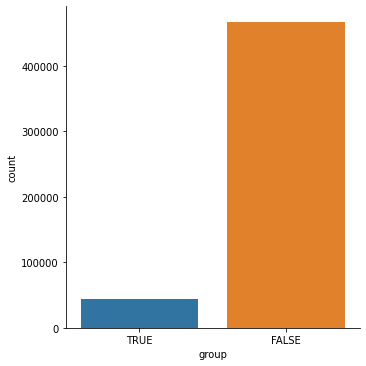

In [0]:
sns.catplot (data = pandas, x ='group', kind='count');

In [0]:
pandas.infection_case.unique()

Out[87]: array(['Uiwang Logistics Center', "Eunpyeong St. Mary's Hospital",
       'Ministry of Oceans and Fisheries',
       'Korea Campus Crusade of Christ', 'Day Care Center',
       'Yeongdeungpo Learning Institute', 'Milal Shelter',
       'Wangsung Church', 'Itaewon Clubs', 'Dongan Church',
       'Samsung Medical Center', 'KB Life Insurance', 'overseas inflow',
       'Gyeongsan Cham Joeun Community Center',
       'Seoul City Hall Station safety worker', 'Yongin Brothers',
       'Orange Town', 'Gyeongsan Seorin Nursing Home', 'Orange Life',
       'SMR Newly Planted Churches Group', 'Changnyeong Coin Karaoke',
       'Geumcheon-gu rice milling machine manufacture',
       'Yeonana News Class', 'Biblical Language study meeting',
       'Geochang Church', 'Daezayeon Korea',
       'Bonghwa Pureun Nursing Home', 'etc', 'gym facility in Cheonan',
       'Pilgrimage to Israel', 'Dunsan Electronics Town',
       'Gangnam Yeoksam-dong gathering', 'Suyeong-gu Kindergarten',
       'Ri

In [0]:
case_true = pandas[pandas['group']=='TRUE']

In [0]:
case_true['infection_case'].value_counts().index

Out[122]: Index(['Shincheonji Church', 'Itaewon Clubs', 'Richway', 'Guro-gu Call Center',
       'Coupang Logistics Center', 'Yangcheon Table Tennis Club',
       'SMR Newly Planted Churches Group', 'Onchun Church',
       'Cheongdo Daenam Hospital', 'Wangsung Church', 'Day Care Center',
       'Bonghwa Pureun Nursing Home', 'gym facility in Cheonan',
       'Ministry of Oceans and Fisheries',
       'Geumcheon-gu rice milling machine manufacture', 'Dongan Church',
       'Eunpyeong St. Mary's Hospital', 'Gyeongsan Seorin Nursing Home',
       'Korea Campus Crusade of Christ', 'Dunsan Electronics Town',
       'KB Life Insurance', 'Seongdong-gu APT', 'Gyeongsan Jeil Silver Town',
       'Milal Shelter', 'Gyeongsan Cham Joeun Community Center', 'Orange Town',
       'Samsung Medical Center', 'Geochang Church',
       'Seoul City Hall Station safety worker',
       'Gangnam Yeoksam-dong gathering', 'Yeonana News Class', 'Seocho Family',
       'Guri Collective Infection', 'Yongin Brother

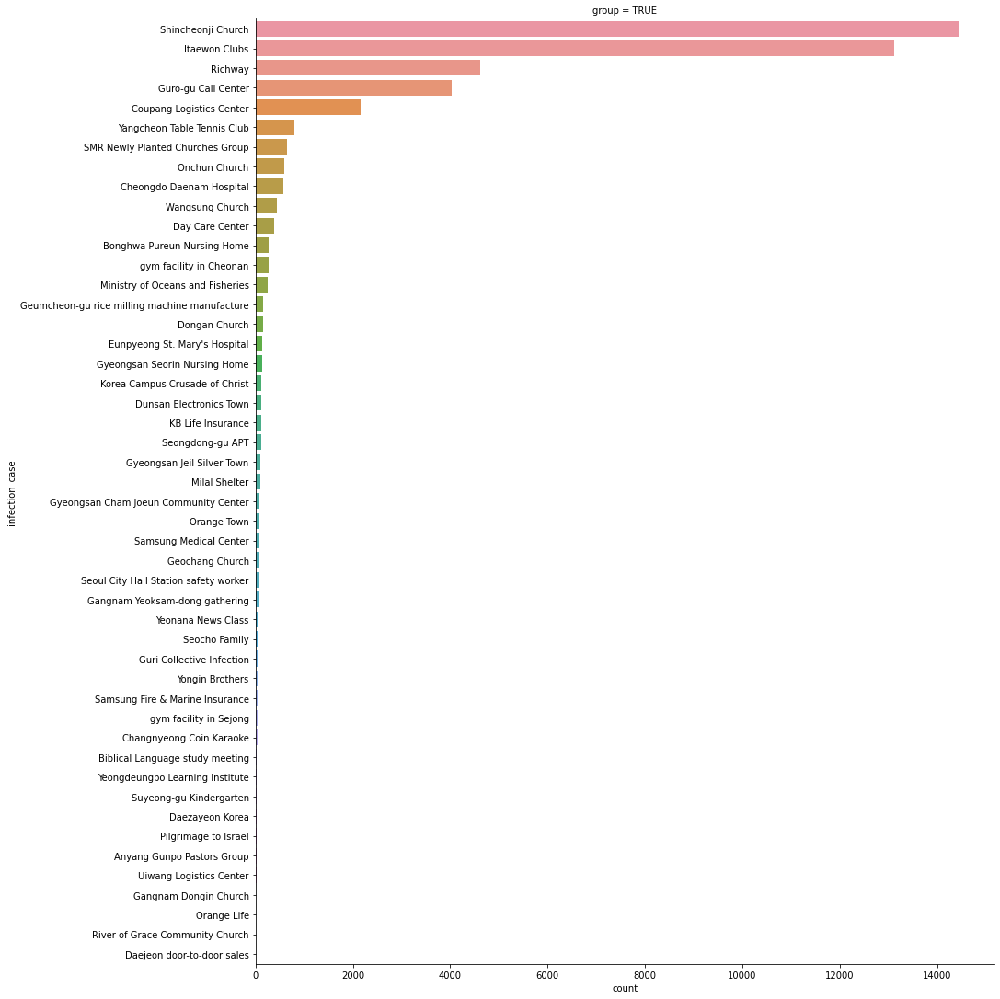

In [0]:
sns.catplot(data =case_true , y="infection_case", kind = "count", col="group", height=15, aspect=1, 
            order = case_true['infection_case'].value_counts().index);

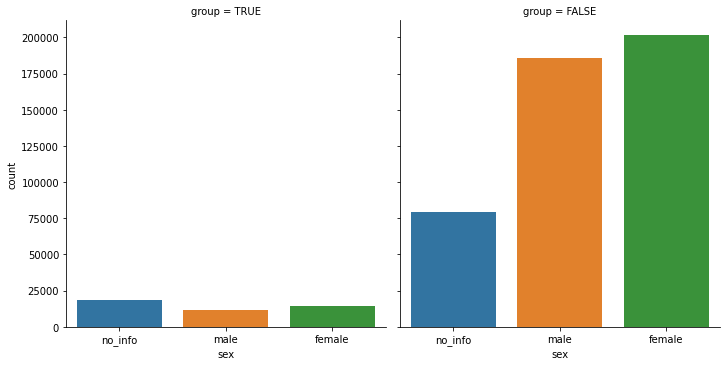

In [0]:
sns.catplot(data = pandas , x="sex", kind = "count", col="group");

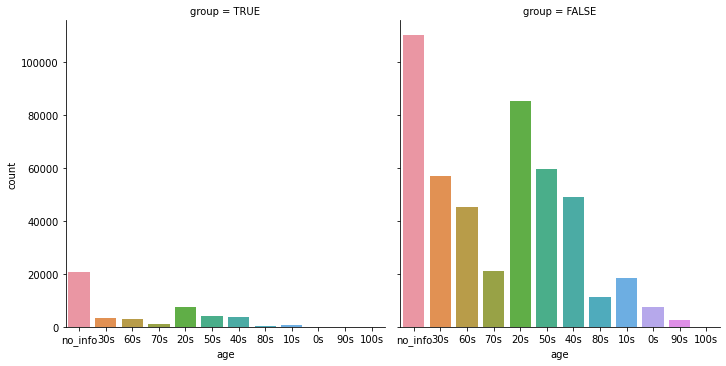

In [0]:
sns.catplot(data = pandas , x="age", kind = "count", col="group");

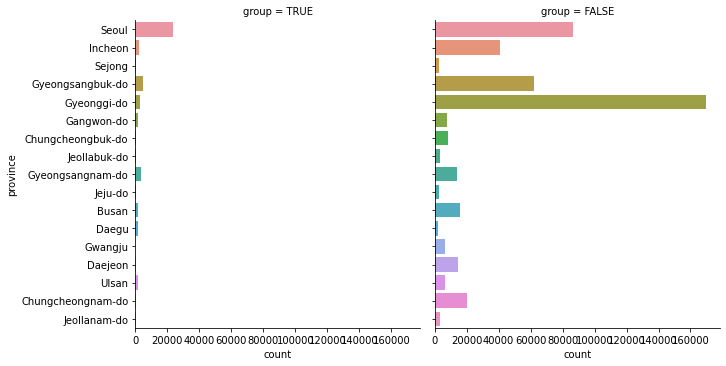

In [0]:
sns.catplot(data = pandas , y="province", kind = "count", col="group");

In [0]:
pandas.city.unique()

Out[93]: array(['Seocho-gu', 'Yeongdeungpo-gu', 'Seodaemun-gu', 'Gangdong-gu',
       'Jongno-gu', 'Eunpyeong-gu', 'Yangcheon-gu', 'etc', 'Yeonsu-gu',
       'Michuhol-gu', 'Namdong-gu', 'Sejong', 'Gangbuk-gu', 'Gangseo-gu',
       'Geumcheon-gu', 'Dobong-gu', 'Jungnang-gu', 'Chilgok-gun',
       'Gwanak-gu', 'Dongjak-gu', 'Nowon-gu', 'Guro-gu', 'Songpa-gu',
       'Yongsan-gu', 'Jung-gu', 'Seongbuk-gu', 'Gangnam-gu',
       'Gwangjin-gu', 'Seongdong-gu', 'Dongdaemun-gu', 'Seo-gu',
       'Bupyeong-gu', 'Yongin-si', 'Seongnam-si', 'Goyang-si',
       'Uijeongbu-si', 'Bucheon-si', 'Hwaseong-si', 'Gwangmyeong-si',
       'Gunpo-si', 'Anyang-si', 'Wonju-si', 'Cheongju-si', 'Gimje-si',
       'Geoje-si', 'Jinju-si', 'Jeju-do', 'Mapo-gu', 'Haeundae-gu',
       'Saha-gu', 'Busanjin-gu', 'Dongnae-gu', 'Buk-gu', 'Geumjeong-gu',
       'Gijang-gun', 'Suyeong-gu', 'Nam-gu', 'Dong-gu', 'Sasang-gu',
       'Dalsung-gun', 'sankyeock-dong', 'Icheon-dong', 'Suseong-gu',
       'Dalseo-gu', 'no_info',

In [0]:
pandas.city.value_counts()

Out[94]: Seongnam-si      25137
Bucheon-si       20835
Yongin-si        15291
Suwon-si         14634
Cheonan-si       12213
                 ...  
Yangpyeong-si      144
Hamyang-gun        144
Danyang-gun        144
Namhae-gun         144
Chilgok-gun         99
Name: city, Length: 161, dtype: int64

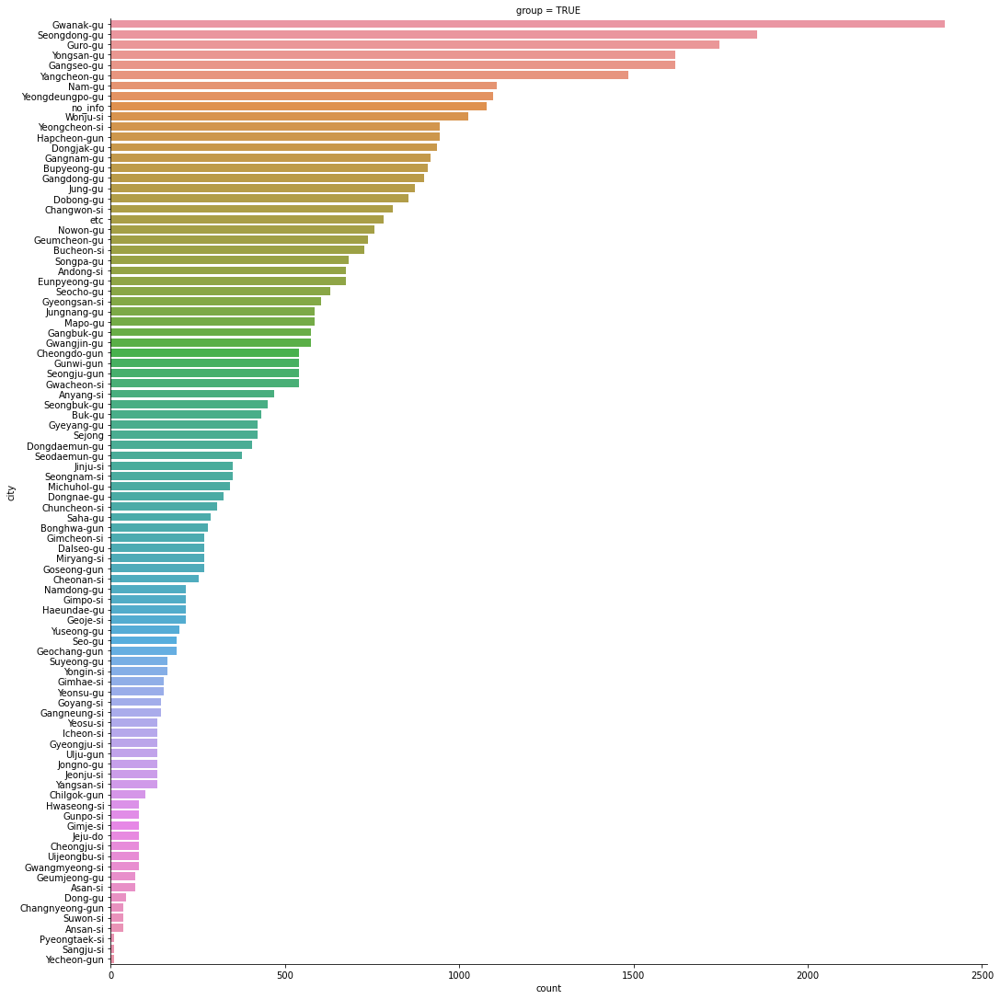

In [0]:
sns.catplot(data =case_true , y="city", kind = "count", col="group", height=15, aspect=1, order = case_true['city'].value_counts().index );

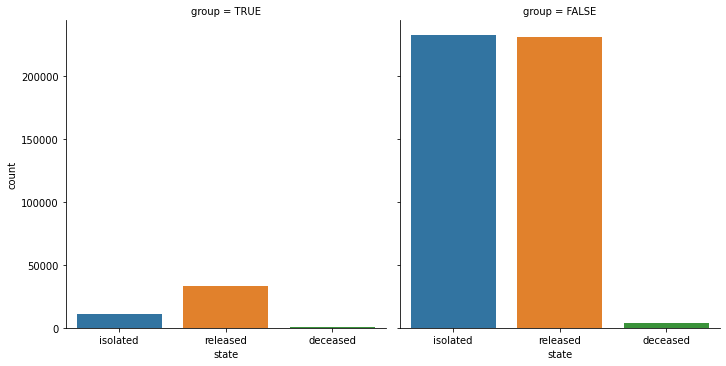

In [0]:
sns.catplot(data = pandas , x="state", kind = "count", col="group");

In [0]:
pandas.case_id.unique()	

Out[97]: array([1000033., 1000011., 1700001., 2000015., 1000017., 1000005.,
       1000024., 6000007., 2000017., 1000010., 7000004., 6100008.,
       5000001., 4000002., 2000003., 1400001., 1200006., 1100006.,
       1000001., 1000008., 1000014., 1000023., 7000001., 6100010.,
       6000011., 5100003., 5000004., 4100006., 4000005., 3000006.,
       2000020., 1700004., 1600002., 1500008., 1400005., 1300003.,
       1200008., 1100008., 1000036., 6000009., 2000018., 1000032.,
       1000031., 1500003., 6000004., 1000034., 2000009., 1000007.,
       6100006., 3000005., 2000016., 1000020., 1000016., 1000026.,
       6100002., 1000035., 6000003., 7000003., 6100012., 6000013.,
       5100005., 5000005., 4100008., 4000007., 3000008., 2000022.,
       1700006., 1600004., 1500010., 1400007., 1300005., 1200010.,
       1100010., 1000038., 4100001., 6000005., 1500002., 1000018.,
       1100003., 4100004., 3000004., 2000004., 1000002., 4000003.,
       2000006., 1400003., 1000003., 1000012., 100002

In [0]:
pandas.case_id.value_counts()

Out[98]: 3000007.0    14490
6100011.0    14490
1000037.0    14490
6000012.0    14490
1500009.0    14490
             ...  
1000019.0        9
2000001.0        9
1000034.0        9
1000028.0        9
1000025.0        9
Name: case_id, Length: 139, dtype: int64

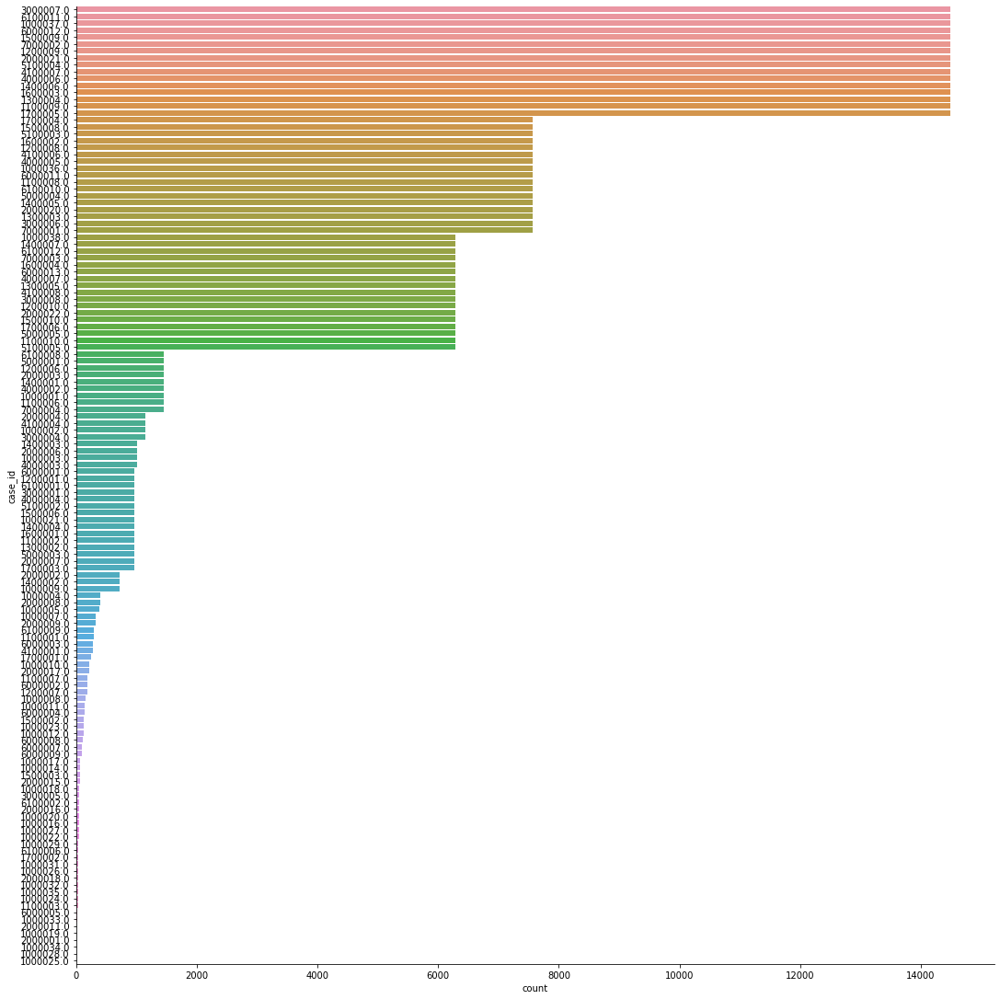

In [0]:
sns.catplot(data =pandas , y="case_id", kind = "count", height=15, aspect=1, order = pandas['case_id'].value_counts().index);

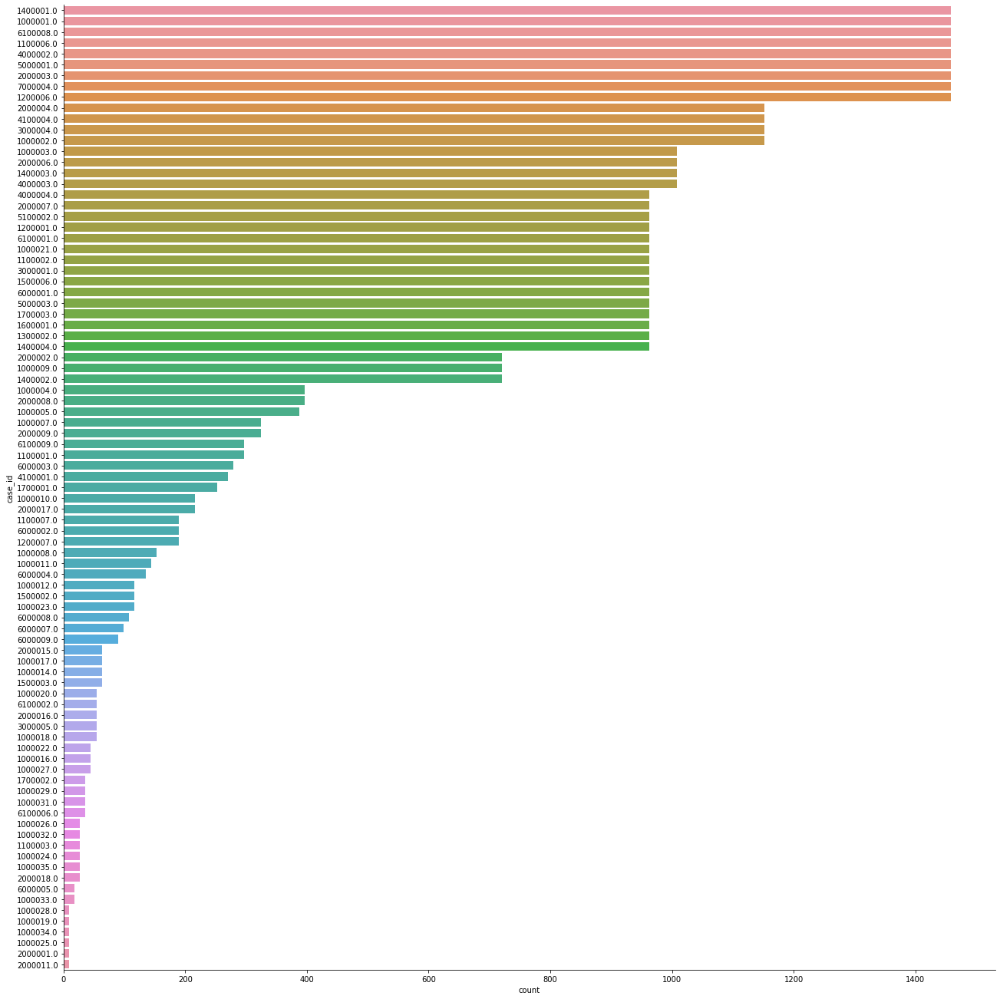

In [0]:
sns.catplot(data =case_true , y="case_id", kind ="count", height=18, aspect=1, order = case_true['case_id'].value_counts().index);

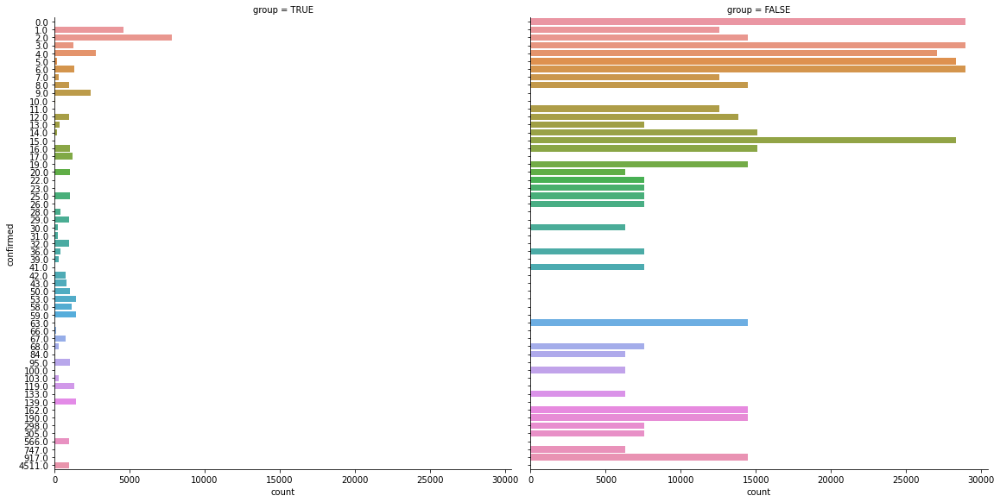

In [0]:
sns.catplot(data = pandas , y="confirmed", kind = "count", col="group", height=8, aspect=1);	

# Machine Learning

In [0]:
dbutils.fs.ls('/letsCode/covid')

Out[1]: [FileInfo(path='dbfs:/letsCode/covid/PatientRoute.csv', name='PatientRoute.csv', size=718510, modificationTime=1653949148000),
 FileInfo(path='dbfs:/letsCode/covid/Policy.csv', name='Policy.csv', size=5713, modificationTime=1653949148000),
 FileInfo(path='dbfs:/letsCode/covid/Region.csv', name='Region.csv', size=19082, modificationTime=1653949149000),
 FileInfo(path='dbfs:/letsCode/covid/SearchTrend.csv', name='SearchTrend.csv', size=71722, modificationTime=1653949149000),
 FileInfo(path='dbfs:/letsCode/covid/SeoulFloating.csv', name='SeoulFloating.csv', size=49682281, modificationTime=1653949152000),
 FileInfo(path='dbfs:/letsCode/covid/Time.csv', name='Time.csv', size=6604, modificationTime=1653949153000),
 FileInfo(path='dbfs:/letsCode/covid/TimeAge.csv', name='TimeAge.csv', size=27114, modificationTime=1653949154000),
 FileInfo(path='dbfs:/letsCode/covid/TimeGender.csv', name='TimeGender.csv', size=6973, modificationTime=1653949154000),
 FileInfo(path='dbfs:/letsCode/covid/

In [0]:
# lendo o meu arquivo tratado 
df = spark.read.load('/letsCode/covid/new_covid_tratado.csv',format="csv", sep=",", inferSchema="true", header="true")
df.show()

+--------------------+------+-------+-------+--------+-----------+-------------------+--------+---------+-----+---------+
|      infection_case|   sex|    age|country|province|       city|     confirmed_date|   state|  case_id|group|confirmed|
+--------------------+------+-------+-------+--------+-----------+-------------------+--------+---------+-----+---------+
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|4000006.0|false|      8.0|
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|3000007.0|false|      0.0|
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|2000021.0|false|     63.0|
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|1700005.0|false|      3.0|
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|1600003.0|false|      3.0|
|contact with patient|fe

Tratando os dados para a modelagem

In [0]:
len (df.select('infection_case').distinct().collect())

Out[38]: 51

In [0]:
len (df.select('province').distinct().collect())

Out[19]: 17

In [0]:
len (df.select('city').distinct().collect())

Out[20]: 161

In [0]:
df.select('age').distinct().collect()

Out[21]: [Row(age='0s'),
 Row(age='10s'),
 Row(age='40s'),
 Row(age='no_info'),
 Row(age='80s'),
 Row(age='70s'),
 Row(age='90s'),
 Row(age='20s'),
 Row(age='50s'),
 Row(age='60s'),
 Row(age='30s'),
 Row(age='100s')]

Com base nesses resultados, serão aplicados as tranformações dos dados de:
  - infection_case: selecinando os meios mais frequentes de contaminação
  - province: somente serão trocados os dados por números
  - contry: será deltado, visto que só há um ( gráfico)
  - sex,state e group : dummy
  - age e confirmed_date: deletadas, pois nãoserão parte do modelo
  - city: como são muitas serão  dados baseados nas provincias

In [0]:
df.count()

Out[25]: 512028

In [0]:
# usando o UDF

from pyspark.sql.types import StringType

def new_col (value):     
    if 'Shincheonji Church' in value: 
        return 1
    elif 'Itaewon Clubs' in value: 
        return 2
    elif 'Richway' in value: 
        return 3  
    elif 'Guro-gu Call Center' in value: 
        return 4
    else: 
        return 0     
    
udf_value_to_category = udf(new_col, StringType())
df = df.withColumn("tag_infect", udf_value_to_category("infection_case"))

display(df)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,0


In [0]:
df.select('tag_infect').distinct().collect()

Out[42]: [Row(tag_infect='0'),
 Row(tag_infect='1'),
 Row(tag_infect='3'),
 Row(tag_infect='4'),
 Row(tag_infect='2')]

In [0]:
df.select('sex').distinct().collect()

Out[69]: [Row(sex='no_info'), Row(sex='female'), Row(sex='male')]

In [0]:
# testando o forma  do StringIndexer, pois da coluna province vou utilizar todos o valores e não parte deles.

from pyspark.ml.feature import StringIndexer

sex_index = StringIndexer(inputCol="sex", outputCol="tag_sex")

#Fits a model to the input dataset with optional parameters.
df = sex_index.fit(df).transform(df)
display(df)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect,tag_sex
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,0,0.0


In [0]:
df.select('tag_sex').distinct().collect()

Out[73]: [Row(tag_sex=0.0), Row(tag_sex=1.0), Row(tag_sex=2.0)]

In [0]:
# tratado a coluna provincias
from pyspark.ml.feature import StringIndexer

province_index = StringIndexer(inputCol="province", outputCol="tag_province")

#Fits a model to the input dataset with optional parameters.
df = province_index.fit(df).transform(df)
display(df)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect,tag_sex,tag_province
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,0,0.0,3.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,0,0.0,3.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,0,0.0,3.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,0,0.0,3.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,0,0.0,3.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,0,0.0,3.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,0,0.0,3.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,0,0.0,3.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,0,0.0,3.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,0,0.0,3.0


In [0]:
df.select('tag_province').distinct().collect()

Out[46]: [Row(tag_province=8.0),
 Row(tag_province=0.0),
 Row(tag_province=7.0),
 Row(tag_province=1.0),
 Row(tag_province=4.0),
 Row(tag_province=14.0),
 Row(tag_province=3.0),
 Row(tag_province=2.0),
 Row(tag_province=10.0),
 Row(tag_province=13.0),
 Row(tag_province=6.0),
 Row(tag_province=15.0),
 Row(tag_province=5.0),
 Row(tag_province=9.0),
 Row(tag_province=16.0),
 Row(tag_province=12.0),
 Row(tag_province=11.0)]

In [0]:
# tratando a coluna status
state_index = StringIndexer(inputCol="state", outputCol="tag_state")

#Fits a model to the input dataset with optional parameters.
df = state_index.fit(df).transform(df)
display(df)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect,tag_sex,tag_province,tag_state
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,0,0.0,3.0,1.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,0,0.0,3.0,1.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,0,0.0,3.0,1.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,0,0.0,3.0,1.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,0,0.0,3.0,1.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,0,0.0,3.0,1.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,0,0.0,3.0,1.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,0,0.0,3.0,1.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,0,0.0,3.0,1.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,0,0.0,3.0,1.0


In [0]:
df.select('tag_state').distinct().collect()

Out[52]: [Row(tag_state=0.0), Row(tag_state=1.0), Row(tag_state=2.0)]

In [0]:
# tratando da coluna group
df.printSchema()

root
 |-- infection_case: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- age: string (nullable = true)
 |-- country: string (nullable = true)
 |-- province: string (nullable = true)
 |-- city: string (nullable = true)
 |-- confirmed_date: timestamp (nullable = true)
 |-- state: string (nullable = true)
 |-- case_id: double (nullable = true)
 |-- group: boolean (nullable = true)
 |-- confirmed: double (nullable = true)
 |-- tag_infect: string (nullable = true)
 |-- sex_no_info: integer (nullable = true)
 |-- sex_female: integer (nullable = true)
 |-- sex_male: integer (nullable = true)
 |-- tag_province: string (nullable = true)
 |-- tag_state: string (nullable = true)
 |-- target: string (nullable = true)



In [0]:
display(df)

org.apache.spark.SparkException: Job aborted due to stage failure: Task 0 in stage 31.0 failed 1 times, most recent failure: Lost task 0.0 in stage 31.0 (TID 57) (ip-10-172-230-17.us-west-2.compute.internal executor driver): org.apache.spark.api.python.PythonException: 'TypeError: argument of type 'bool' is not iterable', from , line 5. Full traceback below:
Traceback (most recent call last):
 File " ", line 5, in new_col4
TypeError: argument of type 'bool' is not iterable

	at org.apache.spark.api.python.BasePythonRunner$ReaderIterator.handlePythonException(PythonRunner.scala:694)
	at org.apache.spark.sql.execution.python.PythonUDFRunner$$anon$2.read(PythonUDFRunner.scala:86)
	at org.apache.spark.sql.execution.python.PythonUDFRunner$$anon$2.read(PythonUDFRunner.scala:68)
	at org.apache.spark.api.python.BasePythonRunner$ReaderIterator.hasNext(PythonRunner.scala:647)
	at org.apache.spark.InterruptibleIterator.hasNext(InterruptibleIterator.scala:37)
	at scala.collection.Iterator$$anon$11.hasNext(Iterator.scala:491)
	at scala.collection.Iterator$$anon$10.hasNext(Iterator.scala:460)
	at scala.collection.Iterator$$anon$10.hasNext(Iterator.scala:460)
	at org.apache.spark.sql.catalyst.expressions.GeneratedClass$GeneratedIteratorForCodegenStage1.processNext(Unknown Source)
	at org.apache.spark.sql.execution.BufferedRowIterator.hasNext(BufferedRowIterator.java:43)
	at org.apache.spark.sql.execution.WholeStageCodegenExec$$anon$1.hasNext(WholeStageCodegenExec.scala:759)
	at org.apache.spark.sql.execution.collect.UnsafeRowBatchUtils$.encodeUnsafeRows(UnsafeRowBatchUtils.scala:80)
	at org.apache.spark.sql.execution.collect.Collector.$anonfun$processFunc$1(Collector.scala:155)
	at org.apache.spark.scheduler.ResultTask.$anonfun$runTask$3(ResultTask.scala:75)
	at com.databricks.spark.util.ExecutorFrameProfiler$.record(ExecutorFrameProfiler.scala:110)
	at org.apache.spark.scheduler.ResultTask.$anonfun$runTask$1(ResultTask.scala:75)
	at com.databricks.spark.util.ExecutorFrameProfiler$.record(ExecutorFrameProfiler.scala:110)
	at org.apache.spark.scheduler.ResultTask.runTask(ResultTask.scala:55)
	at org.apache.spark.scheduler.Task.doRunTask(Task.scala:156)
	at org.apache.spark.scheduler.Task.$anonfun$run$1(Task.scala:125)
	at com.databricks.spark.util.ExecutorFrameProfiler$.record(ExecutorFrameProfiler.scala:110)
	at org.apache.spark.scheduler.Task.run(Task.scala:95)
	at org.apache.spark.executor.Executor$TaskRunner.$anonfun$run$13(Executor.scala:826)
	at org.apache.spark.util.Utils$.tryWithSafeFinally(Utils.scala:1670)
	at org.apache.spark.executor.Executor$TaskRunner.$anonfun$run$4(Executor.scala:829)
	at scala.runtime.java8.JFunction0$mcV$sp.apply(JFunction0$mcV$sp.java:23)
	at com.databricks.spark.util.ExecutorFrameProfiler$.record(ExecutorFrameProfiler.scala:110)
	at org.apache.spark.executor.Executor$TaskRunner.run(Executor.scala:684)
	at java.util.concurrent.ThreadPoolExecutor.runWorker(ThreadPoolExecutor.java:1149)
	at java.util.concurrent.ThreadPoolExecutor$Worker.run(ThreadPoolExecutor.java:624)
	at java.lang.Thread.run(Thread.java:748)

Driver stacktrace:
	at org.apache.spark.scheduler.DAGScheduler.failJobAndIndependentStages(DAGScheduler.scala:2984)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$abortStage$2(DAGScheduler.scala:2931)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$abortStage$2$adapted(DAGScheduler.scala:2925)
	at scala.collection.mutable.ResizableArray.foreach(ResizableArray.scala:62)
	at scala.collection.mutable.ResizableArray.foreach$(ResizableArray.scala:55)
	at scala.collection.mutable.ArrayBuffer.foreach(ArrayBuffer.scala:49)
	at org.apache.spark.scheduler.DAGScheduler.abortStage(DAGScheduler.scala:2925)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$handleTaskSetFailed$1(DAGScheduler.scala:1345)
	at org.apache.spark.scheduler.DAGScheduler.$anonfun$handleTaskSetFailed$1$adapted(DAGScheduler.scala:1345)
	at scala.Option.foreach(Option.scala:407)
	at org.apache.spark.scheduler.DAGScheduler.handleTas

In [0]:
# mudando de bool para str a coluna group
from pyspark.sql.types import StringType,BooleanType,DateType
df = df.withColumn("group",col("group").cast(StringType())) 

In [0]:
df.printSchema()

root
 |-- infection_case: string (nullable = true)
 |-- sex: string (nullable = true)
 |-- age: string (nullable = true)
 |-- country: string (nullable = true)
 |-- province: string (nullable = true)
 |-- city: string (nullable = true)
 |-- confirmed_date: timestamp (nullable = true)
 |-- state: string (nullable = true)
 |-- case_id: double (nullable = true)
 |-- group: string (nullable = true)
 |-- confirmed: double (nullable = true)
 |-- tag_infect: string (nullable = true)
 |-- tag_sex: double (nullable = false)
 |-- tag_province: double (nullable = false)
 |-- tag_state: double (nullable = false)



In [0]:
target_index = StringIndexer(inputCol="group", outputCol="target")

#Fits a model to the input dataset with optional parameters.
df = target_index.fit(df).transform(df)
display(df)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect,tag_sex,tag_province,tag_state,target
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,0,0.0,3.0,1.0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,0,0.0,3.0,1.0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,0,0.0,3.0,1.0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,0,0.0,3.0,1.0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,0,0.0,3.0,1.0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,0,0.0,3.0,1.0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,0,0.0,3.0,1.0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,0,0.0,3.0,1.0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,0,0.0,3.0,1.0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,0,0.0,3.0,1.0,0.0


In [0]:
df.select('target').distinct().collect()

Out[80]: [Row(target=0.0), Row(target=1.0)]

In [0]:
df.columns

Out[39]: ['infection_case',
 'sex',
 'age',
 'country',
 'province',
 'city',
 'confirmed_date',
 'state',
 'case_id',
 'group',
 'confirmed',
 'tag_infect',
 'sex_no_info',
 'sex_female',
 'sex_male',
 'tag_province',
 'tag_state',
 'target']

In [0]:
# deletando as colunas que não serão utilizadas na modelagem, até o momento

cols = ('infection_case', 'sex', 'age', 'country','province', 'city', 'confirmed_date', 'state', 'group')
df = df.drop(*cols)

display(df)


case_id,confirmed,tag_infect,tag_sex,tag_province,tag_state,target
4000006.0,8.0,0,0.0,3.0,1.0,0.0
3000007.0,0.0,0,0.0,3.0,1.0,0.0
2000021.0,63.0,0,0.0,3.0,1.0,0.0
1700005.0,3.0,0,0.0,3.0,1.0,0.0
1600003.0,3.0,0,0.0,3.0,1.0,0.0
1500009.0,15.0,0,0.0,3.0,1.0,0.0
1400006.0,6.0,0,0.0,3.0,1.0,0.0
1300004.0,5.0,0,0.0,3.0,1.0,0.0
1200009.0,917.0,0,0.0,3.0,1.0,0.0
1100009.0,19.0,0,0.0,3.0,1.0,0.0


Agora é necessário fazer a transformação de dummy nas colunas:
- tag_infect
- tag_sex
- tag_province
- tag_state


Porém, antes disso é necessário mudar o tipo so dados para numérico

In [0]:
df.printSchema()

root
 |-- case_id: double (nullable = true)
 |-- confirmed: double (nullable = true)
 |-- tag_infect: string (nullable = true)
 |-- tag_sex: double (nullable = false)
 |-- tag_province: double (nullable = false)
 |-- tag_state: double (nullable = false)
 |-- target: double (nullable = false)



In [0]:
from pyspark.sql.types import IntegerType

df = df.withColumn('case_id', col('case_id').cast(IntegerType()))\
.withColumn('confirmed', col('confirmed').cast(IntegerType()))\
.withColumn('tag_infect', col('tag_infect').cast(IntegerType()))\
.withColumn('tag_sex', col('tag_sex').cast(IntegerType()))\
.withColumn('tag_province', col('tag_province').cast(IntegerType()))\
.withColumn('tag_state', col('tag_state').cast(IntegerType()))\
.withColumn('target', col('target').cast(IntegerType()))

In [0]:
df.printSchema()

root
 |-- case_id: integer (nullable = true)
 |-- confirmed: integer (nullable = true)
 |-- tag_infect: integer (nullable = true)
 |-- tag_sex: integer (nullable = true)
 |-- tag_province: integer (nullable = true)
 |-- tag_state: integer (nullable = true)
 |-- target: integer (nullable = true)



In [0]:
from pyspark.ml.feature import OneHotEncoder

# criando um pipeline para o restante das tranformações
ohe_infect = OneHotEncoder(inputCol="tag_infect", outputCol="ohe_infect")
ohe_sex = OneHotEncoder(inputCol="tag_sex", outputCol="ohe_sex")
ohe_province = OneHotEncoder(inputCol="tag_province", outputCol="ohe_province")
ohe_state = OneHotEncoder(inputCol="tag_state", outputCol="ohe_state")

from pyspark.ml import Pipeline
#Create pipeline and pass all stages
pipe = Pipeline(stages=[ohe_infect,
                        ohe_sex, 
                        ohe_province, 
                        ohe_state])

df_transformed = pipe.fit(df).transform(df)
display(df_transformed)

case_id,confirmed,tag_infect,tag_sex,tag_province,tag_state,target,ohe_infect,ohe_sex,ohe_province,ohe_state
4000006,8,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
3000007,0,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
2000021,63,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1700005,3,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1600003,3,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1500009,15,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1400006,6,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1300004,5,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1200009,917,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1100009,19,0,0,3,1,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"


In [0]:
display(df)

case_id,confirmed,tag_infect,tag_sex,tag_province,tag_state,target,ohe_infect
4000006,8,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"
3000007,0,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"
2000021,63,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"
1700005,3,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"
1600003,3,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"
1500009,15,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"
1400006,6,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"
1300004,5,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"
1200009,917,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"
1100009,19,0,0,3,1.0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))"


In [0]:
# deletando as colunas tag

cols = ('tag_infect', 'tag_sex', 'tag_province', 'tag_state')
df2 = df_transformed.drop(*cols)

display(df2)


case_id,confirmed,target,ohe_infect,ohe_sex,ohe_province,ohe_state
4000006,8,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
3000007,0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
2000021,63,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1700005,3,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1600003,3,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1500009,15,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1400006,6,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1300004,5,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1200009,917,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1100009,19,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"


In [0]:
print(df2.schema["ohe_infect"].dataType)

VectorUDT


com relação as tranformações:
- Primeiro  eu fiz a escolha de alguns valores a serem utilizados, quando necessário, e em seguida  a tranformação dos mesmo de texto para número, porpem em ambos os caso o tipo do dados continulou como string

- em seguia fiz a transformação dos dados str/double para int

- posteriomente fiz a vetorização dos dados com o one hot enconder

FONTE: https://medium.com/@nutanbhogendrasharma/role-of-onehotencoder-and-pipelines-in-pyspark-ml-feature-part-2-3275767e74f0
 
 Esquema das tranformações
 
![image](https://user-images.githubusercontent.com/71708626/171385330-9652a141-918b-4636-9082-d0023e78853d.png)

**interpretando os vetores** 

Segundo Sharmo Sarkar, o uso dessa rota de tranformações funciona muito bem para quando a modelagem downstream é feita no Spark,, pois o PySpark consegue envolver os vetores codificados em um vetor denso (VectorUDT), o que funciona muito bem no mundo Spark, mas não permite que os vetores sejam escritos no formato csv. Além disso, o vetor não é humanamente compreensível (especialmente para grandes colunas de cardinalidade).

fonte: https://towardsdev.com/how-to-write-pyspark-one-hot-encoding-results-to-an-interpretable-csv-file-626ecb973962

Então ele propoe um novo tipo de tranformação, a qual irei realizar por questões de aprendizado e também para salvar os dados, antes da aplicação dos algoritmos de classifiação.

A ideia é utilizar o modelo de regressão logistica nos dois tipos de transfromação e verificar como esse processo afeta os resultados, visto que com o uso do One Hot Enconder é bem diferente do apresentado pelo sklearn

In [0]:
# lendo o meu arquivo tratado novamente 
df3 = spark.read.load('/letsCode/covid/new_covid_tratado.csv',format="csv", sep=",", inferSchema="true", header="true")
df3.show()

+--------------------+------+-------+-------+--------+-----------+-------------------+--------+---------+-----+---------+
|      infection_case|   sex|    age|country|province|       city|     confirmed_date|   state|  case_id|group|confirmed|
+--------------------+------+-------+-------+--------+-----------+-------------------+--------+---------+-----+---------+
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|4000006.0|false|      8.0|
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|3000007.0|false|      0.0|
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|2000021.0|false|     63.0|
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|1700005.0|false|      3.0|
|contact with patient|female|no_info|  Korea| Incheon|Michuhol-gu|2020-06-03 00:00:00|isolated|1600003.0|false|      3.0|
|contact with patient|fe

In [0]:
def new_col (value):     
    if 'Shincheonji Church' in value: 
        return 'Shincheonji Church'
    elif 'Itaewon Clubs' in value: 
        return 'Itaewon Clubs'
    elif 'Richway' in value: 
        return 'Richway' 
    elif 'Guro-gu Call Center' in value: 
        return 'Guro-gu Call Center'
    else: 
        return 'Other'    
    
udf_value_to_category = udf(new_col, StringType())
df3 = df3.withColumn("tag_infect", udf_value_to_category("infection_case"))

display(df3)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,Other
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,Other
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,Other
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,Other
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,Other
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,Other
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,Other
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,Other
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,Other
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,Other


In [0]:
# um forma de fazer o dummy 

from pyspark.sql.functions import udf, col
from pyspark.sql.types import IntegerType

distinct_values = df3.select("tag_infect")\
                    .distinct()\
                    .rdd\
                    .flatMap(lambda x: x).collect()

for value in distinct_values:
    function = udf(lambda item: 
                   1 if item == value else 0, 
                   IntegerType())
    new_column_name = "infect"+'_'+value
    df3 = df3.withColumn(new_column_name, function(col("tag_infect")))
    
display(df3)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect,infect_Other,infect_Shincheonji Church,infect_Richway,infect_Guro-gu Call Center,infect_Itaewon Clubs
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,Other,1,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,Other,1,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,Other,1,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,Other,1,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,Other,1,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,Other,1,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,Other,1,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,Other,1,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,Other,1,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,Other,1,0,0,0,0


In [0]:
distinct_values = df3.select("sex")\
                    .distinct()\
                    .rdd\
                    .flatMap(lambda x: x).collect()

for value in distinct_values:
    function = udf(lambda item: 
                   1 if item == value else 0, 
                   IntegerType())
    new_column_name = "sex"+'_'+value
    df3 = df3.withColumn(new_column_name, function(col("sex")))
    
display(df3)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect,infect_Other,infect_Shincheonji Church,infect_Richway,infect_Guro-gu Call Center,infect_Itaewon Clubs,sex_no_info,sex_female,sex_male
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,Other,1,0,0,0,0,0,1,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,Other,1,0,0,0,0,0,1,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,Other,1,0,0,0,0,0,1,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,Other,1,0,0,0,0,0,1,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,Other,1,0,0,0,0,0,1,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,Other,1,0,0,0,0,0,1,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,Other,1,0,0,0,0,0,1,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,Other,1,0,0,0,0,0,1,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,Other,1,0,0,0,0,0,1,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,Other,1,0,0,0,0,0,1,0


In [0]:
distinct_values = df3.select("province")\
                    .distinct()\
                    .rdd\
                    .flatMap(lambda x: x).collect()

for value in distinct_values:
    function = udf(lambda item: 
                   1 if item == value else 0, 
                   IntegerType())
    new_column_name = "province"+'_'+value
    df3 = df3.withColumn(new_column_name, function(col("province")))
    
display(df3)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect,infect_Other,infect_Shincheonji Church,infect_Richway,infect_Guro-gu Call Center,infect_Itaewon Clubs,sex_no_info,sex_female,sex_male,province_Sejong,province_Ulsan,province_Chungcheongbuk-do,province_Gangwon-do,province_Gyeongsangbuk-do,province_Daegu,province_Gyeongsangnam-do,province_Incheon,province_Jeju-do,province_Gyeonggi-do,province_Busan,province_Daejeon,province_Seoul,province_Chungcheongnam-do,province_Jeollabuk-do,province_Jeollanam-do,province_Gwangju
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [0]:
distinct_values = df3.select("state")\
                    .distinct()\
                    .rdd\
                    .flatMap(lambda x: x).collect()

for value in distinct_values:
    function = udf(lambda item: 
                   1 if item == value else 0, 
                   IntegerType())
    new_column_name = "state"+'_'+value
    df3 = df3.withColumn(new_column_name, function(col("state")))
    
display(df3)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect,infect_Other,infect_Shincheonji Church,infect_Richway,infect_Guro-gu Call Center,infect_Itaewon Clubs,sex_no_info,sex_female,sex_male,province_Sejong,province_Ulsan,province_Chungcheongbuk-do,province_Gangwon-do,province_Gyeongsangbuk-do,province_Daegu,province_Gyeongsangnam-do,province_Incheon,province_Jeju-do,province_Gyeonggi-do,province_Busan,province_Daejeon,province_Seoul,province_Chungcheongnam-do,province_Jeollabuk-do,province_Jeollanam-do,province_Gwangju,state_isolated,state_released,state_deceased
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0


In [0]:
# mudando de bool para str a coluna group
from pyspark.sql.types import StringType,BooleanType,DateType
df3 = df3.withColumn("group",col("group").cast(StringType()))


In [0]:
# o tratamento de group é para o que já temos só T e F
target_index = StringIndexer(inputCol="group", outputCol="target")

#Fits a model to the input dataset with optional parameters.
df3 = target_index.fit(df3).transform(df3)
display(df3)

infection_case,sex,age,country,province,city,confirmed_date,state,case_id,group,confirmed,tag_infect,infect_Other,infect_Shincheonji Church,infect_Richway,infect_Guro-gu Call Center,infect_Itaewon Clubs,sex_no_info,sex_female,sex_male,province_Sejong,province_Ulsan,province_Chungcheongbuk-do,province_Gangwon-do,province_Gyeongsangbuk-do,province_Daegu,province_Gyeongsangnam-do,province_Incheon,province_Jeju-do,province_Gyeonggi-do,province_Busan,province_Daejeon,province_Seoul,province_Chungcheongnam-do,province_Jeollabuk-do,province_Jeollanam-do,province_Gwangju,state_isolated,state_released,state_deceased,target
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,4000006.0,false,8.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,3000007.0,false,0.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,2000021.0,false,63.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1700005.0,false,3.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1600003.0,false,3.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1500009.0,false,15.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1400006.0,false,6.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1300004.0,false,5.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1200009.0,false,917.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
contact with patient,female,no_info,Korea,Incheon,Michuhol-gu,2020-06-03T00:00:00.000+0000,isolated,1100009.0,false,19.0,Other,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0


In [0]:
df3.columns

Out[148]: ['infection_case',
 'sex',
 'age',
 'country',
 'province',
 'city',
 'confirmed_date',
 'state',
 'case_id',
 'group',
 'confirmed',
 'tag_infect',
 'infect_Other',
 'infect_Shincheonji Church',
 'infect_Richway',
 'infect_Guro-gu Call Center',
 'infect_Itaewon Clubs',
 'sex_no_info',
 'sex_female',
 'sex_male',
 'province_Sejong',
 'province_Ulsan',
 'province_Chungcheongbuk-do',
 'province_Gangwon-do',
 'province_Gyeongsangbuk-do',
 'province_Daegu',
 'province_Gyeongsangnam-do',
 'province_Incheon',
 'province_Jeju-do',
 'province_Gyeonggi-do',
 'province_Busan',
 'province_Daejeon',
 'province_Seoul',
 'province_Chungcheongnam-do',
 'province_Jeollabuk-do',
 'province_Jeollanam-do',
 'province_Gwangju',
 'state_isolated',
 'state_released',
 'state_deceased',
 'target']

In [0]:
# deletando as colunas que não serão usadas
cols = ('infection_case', 'sex', 'age', 'country', 'province', 'city', 'confirmed_date', 'state', 'group','tag_infect')
df3 = df3.drop(*cols)

display(df3)

case_id,confirmed,infect_Other,infect_Shincheonji Church,infect_Richway,infect_Guro-gu Call Center,infect_Itaewon Clubs,sex_no_info,sex_female,sex_male,province_Sejong,province_Ulsan,province_Chungcheongbuk-do,province_Gangwon-do,province_Gyeongsangbuk-do,province_Daegu,province_Gyeongsangnam-do,province_Incheon,province_Jeju-do,province_Gyeonggi-do,province_Busan,province_Daejeon,province_Seoul,province_Chungcheongnam-do,province_Jeollabuk-do,province_Jeollanam-do,province_Gwangju,state_isolated,state_released,state_deceased,target
4000006.0,8.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
3000007.0,0.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
2000021.0,63.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
1700005.0,3.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
1600003.0,3.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
1500009.0,15.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
1400006.0,6.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
1300004.0,5.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
1200009.0,917.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0
1100009.0,19.0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0.0


In [0]:
# tranformando os dados em INT
from pyspark.sql.types import IntegerType

col = df3.columns

for i in col:
    df3= df3.withColumn(i, df3[i].cast(IntegerType()))
    

In [0]:
df3.printSchema()

root
 |-- case_id: integer (nullable = true)
 |-- confirmed: integer (nullable = true)
 |-- infect_Other: integer (nullable = true)
 |-- infect_Shincheonji Church: integer (nullable = true)
 |-- infect_Richway: integer (nullable = true)
 |-- infect_Guro-gu Call Center: integer (nullable = true)
 |-- infect_Itaewon Clubs: integer (nullable = true)
 |-- sex_no_info: integer (nullable = true)
 |-- sex_female: integer (nullable = true)
 |-- sex_male: integer (nullable = true)
 |-- province_Sejong: integer (nullable = true)
 |-- province_Ulsan: integer (nullable = true)
 |-- province_Chungcheongbuk-do: integer (nullable = true)
 |-- province_Gangwon-do: integer (nullable = true)
 |-- province_Gyeongsangbuk-do: integer (nullable = true)
 |-- province_Daegu: integer (nullable = true)
 |-- province_Gyeongsangnam-do: integer (nullable = true)
 |-- province_Incheon: integer (nullable = true)
 |-- province_Jeju-do: integer (nullable = true)
 |-- province_Gyeonggi-do: integer (nullable = true)
 |-

In [0]:
# salvando os dados feitos com a segunda transformação
df3.write.option("header",True).csv("/letsCode/covid/covid_transformado.csv")

In [0]:
dbutils.fs.ls('/letsCode/covid')

Out[154]: [FileInfo(path='dbfs:/letsCode/covid/PatientRoute.csv', name='PatientRoute.csv', size=718510, modificationTime=1653949148000),
 FileInfo(path='dbfs:/letsCode/covid/Policy.csv', name='Policy.csv', size=5713, modificationTime=1653949148000),
 FileInfo(path='dbfs:/letsCode/covid/Region.csv', name='Region.csv', size=19082, modificationTime=1653949149000),
 FileInfo(path='dbfs:/letsCode/covid/SearchTrend.csv', name='SearchTrend.csv', size=71722, modificationTime=1653949149000),
 FileInfo(path='dbfs:/letsCode/covid/SeoulFloating.csv', name='SeoulFloating.csv', size=49682281, modificationTime=1653949152000),
 FileInfo(path='dbfs:/letsCode/covid/Time.csv', name='Time.csv', size=6604, modificationTime=1653949153000),
 FileInfo(path='dbfs:/letsCode/covid/TimeAge.csv', name='TimeAge.csv', size=27114, modificationTime=1653949154000),
 FileInfo(path='dbfs:/letsCode/covid/TimeGender.csv', name='TimeGender.csv', size=6973, modificationTime=1653949154000),
 FileInfo(path='dbfs:/letsCode/covi

**MODELAGEM**

In [0]:
# Cria o objeto log reg
from pyspark.ml.classification import LogisticRegression
lr = LogisticRegression()

In [0]:
display(df2)

case_id,confirmed,target,ohe_infect,ohe_sex,ohe_province,ohe_state
4000006,8,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
3000007,0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
2000021,63,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1700005,3,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1600003,3,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1500009,15,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1400006,6,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1300004,5,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1200009,917,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"
1100009,19,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))"


In [0]:
display(df3)

case_id,confirmed,infect_Other,infect_Shincheonji Church,infect_Richway,infect_Guro-gu Call Center,infect_Itaewon Clubs,sex_no_info,sex_female,sex_male,province_Sejong,province_Ulsan,province_Chungcheongbuk-do,province_Gangwon-do,province_Gyeongsangbuk-do,province_Daegu,province_Gyeongsangnam-do,province_Incheon,province_Jeju-do,province_Gyeonggi-do,province_Busan,province_Daejeon,province_Seoul,province_Chungcheongnam-do,province_Jeollabuk-do,province_Jeollanam-do,province_Gwangju,state_isolated,state_released,state_deceased,target
4000006,8,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
3000007,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
2000021,63,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1700005,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1600003,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1500009,15,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1400006,6,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1300004,5,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1200009,917,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0
1100009,19,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0


In [0]:
# tranformação OHE
X2 = df2.drop("target")
y2 = df2.select("target")

# tranformação dummy
X3 = df3.drop("target")
y3 = df3.select("target")

In [0]:
from pyspark.ml.feature import VectorAssembler

# cria o objeto assembler -> T_OHE
assembler = VectorAssembler(inputCols=X2.columns, outputCol='features')
assembled_df2 = assembler.transform(df2)

In [0]:
display(assembled_df2)

case_id,confirmed,target,ohe_infect,ohe_sex,ohe_province,ohe_state,features
4000006,8,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 11, 25), values -> List(4000006.0, 8.0, 1.0, 1.0, 1.0, 1.0))"
3000007,0,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 26, indices -> List(0, 2, 6, 11, 25), values -> List(3000007.0, 1.0, 1.0, 1.0, 1.0))"
2000021,63,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 11, 25), values -> List(2000021.0, 63.0, 1.0, 1.0, 1.0, 1.0))"
1700005,3,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 11, 25), values -> List(1700005.0, 3.0, 1.0, 1.0, 1.0, 1.0))"
1600003,3,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 11, 25), values -> List(1600003.0, 3.0, 1.0, 1.0, 1.0, 1.0))"
1500009,15,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 11, 25), values -> List(1500009.0, 15.0, 1.0, 1.0, 1.0, 1.0))"
1400006,6,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 11, 25), values -> List(1400006.0, 6.0, 1.0, 1.0, 1.0, 1.0))"
1300004,5,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 16, indices -> List(3), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 11, 25), values -> List(1300004.0, 5.0, 1.0, 1.0, 1.0, 1.0))"
1200009,917,0,"Map(vectorType -> sparse, length -> 4, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 2, indices -> List(

In [0]:
# cria o objeto assembler-> Dummy
assembler = VectorAssembler(inputCols=X3.columns, outputCol='features')
assembled_df3 = assembler.transform(df3)
display(assembled_df3)

case_id,confirmed,infect_Other,infect_Shincheonji Church,infect_Richway,infect_Guro-gu Call Center,infect_Itaewon Clubs,sex_no_info,sex_female,sex_male,province_Sejong,province_Ulsan,province_Chungcheongbuk-do,province_Gangwon-do,province_Gyeongsangbuk-do,province_Daegu,province_Gyeongsangnam-do,province_Incheon,province_Jeju-do,province_Gyeonggi-do,province_Busan,province_Daejeon,province_Seoul,province_Chungcheongnam-do,province_Jeollabuk-do,province_Jeollanam-do,province_Gwangju,state_isolated,state_released,state_deceased,target,features
4000006,8,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 8, 17, 27), values -> List(4000006.0, 8.0, 1.0, 1.0, 1.0, 1.0))"
3000007,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 2, 8, 17, 27), values -> List(3000007.0, 1.0, 1.0, 1.0, 1.0))"
2000021,63,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 8, 17, 27), values -> List(2000021.0, 63.0, 1.0, 1.0, 1.0, 1.0))"
1700005,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 8, 17, 27), values -> List(1700005.0, 3.0, 1.0, 1.0, 1.0, 1.0))"
1600003,3,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 8, 17, 27), values -> List(1600003.0, 3.0, 1.0, 1.0, 1.0, 1.0))"
1500009,15,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 8, 17, 27), values -> List(1500009.0, 15.0, 1.0, 1.0, 1.0, 1.0))"
1400006,6,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 8, 17, 27), values -> List(1400006.0, 6.0, 1.0, 1.0, 1.0, 1.0))"
1300004,5,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 8, 17, 27), values -> List(1300004.0, 5.0, 1.0, 1.0, 1.0, 1.0))"
1200009,917,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 8, 17, 27), values -> List(1200009.0, 917.0, 1.0, 1.0, 1.0, 1.0))"
1100009,19,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 8, 17, 27), values -> List(1100009.0, 19.0, 1.0, 1.0, 1.0, 1.0))"


In [0]:
print(assembled_df2.schema["features"].dataType)
print(assembled_df3.schema["features"].dataType)

VectorUDT
VectorUDT


Nota-se que para ambos os métodos de tranformação, o assembler faz a coluna features como um vetor UDT. Sendo assim acredito que não haja diferenças entre as duas modelagens.

Seguindo os passos proposto por Nutan, vou criar um novo DF só com as colunas feature e target
 - https://medium.com/@nutanbhogendrasharma/feature-transformer-vectorassembler-in-pyspark-ml-feature-part-3-b3c2c3c93ee9

In [0]:
# segun
df2_ML = assembled_df2.select(['features','target'])
df2_ML.show()

+--------------------+------+
|            features|target|
+--------------------+------+
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,2,6,11,25]...|     0|
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,1,2,6,11,2...|     0|
|(26,[0,2,7,11,25]...|     0|
|(26,[0,1,2,7,11,2...|     0|
|(26,[0,1,2,7,11,2...|     0|
|(26,[0,1,2,7,11,2...|     0|
|(26,[0,1,2,7,11,2...|     0|
|(26,[0,1,2,7,11,2...|     0|
|(26,[0,2,7,11,25]...|     0|
|(26,[0,1,2,7,11,2...|     0|
|(26,[0,1,2,7,11,2...|     0|
+--------------------+------+
only showing top 20 rows



In [0]:
df3_ML =assembled_df3.select(['features','target'])
df3_ML.show()

+--------------------+------+
|            features|target|
+--------------------+------+
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,2,8,17,27]...|     0|
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,1,2,8,17,2...|     0|
|(30,[0,2,9,17,27]...|     0|
|(30,[0,1,2,9,17,2...|     0|
|(30,[0,1,2,9,17,2...|     0|
|(30,[0,1,2,9,17,2...|     0|
|(30,[0,1,2,9,17,2...|     0|
|(30,[0,1,2,9,17,2...|     0|
|(30,[0,2,9,17,27]...|     0|
|(30,[0,1,2,9,17,2...|     0|
|(30,[0,1,2,9,17,2...|     0|
+--------------------+------+
only showing top 20 rows



In [0]:
(train2, test2) = df2_ML.randomSplit([0.8,0.2], seed =42)
(train3, test3) = df3_ML.randomSplit([0.8,0.2], seed =42)

In [0]:
print ("df2")
print (sparkShape(train2))
print (sparkShape(test2))

print ('=================')

print ("df3")
print (sparkShape(train3))
print (sparkShape(test3))

df2
(409690, 2)
(102338, 2)
df3
(409690, 2)
(102338, 2)


In [0]:
# renomeando a coluna target para label, pois se não dará erro quando for fazer o fit: IllegalArgumentException: label does not exist. Available: features, target

train2 = train2.withColumnRenamed('target','label')
train3 = train3.withColumnRenamed('target','label')

test2 = test2.withColumnRenamed('target','label')
test3 = test3.withColumnRenamed('target','label')


In [0]:
# uma amostra de como ficou os dados de treino
train3.show(5)

+--------------------+-----+
|            features|label|
+--------------------+-----+
|(30,[0,1,2,7,11,2...|    0|
|(30,[0,1,2,7,11,2...|    0|
|(30,[0,1,2,7,11,2...|    0|
|(30,[0,1,2,7,11,2...|    0|
|(30,[0,1,2,7,11,2...|    0|
+--------------------+-----+
only showing top 5 rows



In [0]:
# uma amostra de como ficou os dados de teste
test3.show(5)

+--------------------+-----+
|            features|label|
+--------------------+-----+
|(30,[0,1,2,7,11,2...|    0|
|(30,[0,1,2,7,11,2...|    0|
|(30,[0,1,2,7,11,2...|    0|
|(30,[0,1,2,7,11,2...|    0|
|(30,[0,1,2,7,11,2...|    0|
+--------------------+-----+
only showing top 5 rows



**Tranformação OHE**

In [0]:
# Treina o algoritmo
model = lr.fit(train2)

In [0]:
# armazena as predições
pred = model.transform(test2)
display(pred)

features,label,rawPrediction,probability,prediction
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0
"Map(vectorType -> sparse, length -> 26, indices -> List(0, 1, 2, 6, 8, 24), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(7.138773102739904, -7.138773102739904))","Map(vectorType -> dense, length -> 2, values -> List(0.99920690418149, 7.930958185099479E-4))",0.0


In [0]:
from pyspark.ml.evaluation import MulticlassClassificationEvaluator

print("Coefficients: " + str(model.coefficients))
print("Intercept: " + str(model.intercept))

Coefficients: [-3.11949593375796e-07,-0.003525412812680139,-59.095967064433665,78.54488031593758,-4.492466398258671,-14.778316334438005,-1.4385340316001425,-1.6080026035158468,7.738653952765248,11.0372055966937,10.90763673861842,10.427854347789632,10.414157841837284,11.258329562681274,10.077712410791635,10.007318387761705,7.971833697690058,-25.54846727064073,-12.900007914980053,-33.96664185861002,-17.960964692064998,-15.997312355084757,-17.472901708450156,12.383356856639443,-1.5922307107735187,-0.6081295982479434]
Intercept: 48.13238276246711


In [0]:
# calcula a acurácia no conjunto de teste.
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(pred)

print("Test set accuracy = " + str(accuracy))

Test set accuracy = 0.9833004358107448


**Tranformação DUMMY**

In [0]:
# Treina o algoritmo
model = lr.fit(train3)

In [0]:
# armazena as predições
pred = model.transform(test3)
display(pred)

features,label,rawPrediction,probability,prediction
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(12.079317139482583, -12.079317139482583))","Map(vectorType -> dense, length -> 2, values -> List(0.9999943243349678, 5.675665032178756E-6))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1200009.0, 917.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(14.797526212317237, -14.797526212317237))","Map(vectorType -> dense, length -> 2, values -> List(0.9999996254447769, 3.745552230594029E-7))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1200009.0, 917.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(14.797526212317237, -14.797526212317237))","Map(vectorType -> dense, length -> 2, values -> List(0.9999996254447769, 3.745552230594029E-7))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1400006.0, 6.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(11.650384998077687, -11.650384998077687))","Map(vectorType -> dense, length -> 2, values -> List(0.9999912843797728, 8.715620227195409E-6))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1600003.0, 3.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(11.69996940650815, -11.69996940650815))","Map(vectorType -> dense, length -> 2, values -> List(0.9999917059958895, 8.294004110509512E-6))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1700005.0, 3.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(11.730043597697708, -11.730043597697708))","Map(vectorType -> dense, length -> 2, values -> List(0.9999919517159118, 8.048284088180147E-6))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(4000006.0, 8.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(12.4393395766044, -12.4393395766044))","Map(vectorType -> dense, length -> 2, values -> List(0.9999960403049226, 3.959695077382364E-6))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(5100004.0, 4.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(12.75606597029816, -12.75606597029816))","Map(vectorType -> dense, length -> 2, values -> List(0.9999971152400137, 2.884759986332419E-6))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 19, 27), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(4.697305247455578, -4.697305247455578))","Map(vectorType -> dense, length -> 2, values -> List(0.9909625997842691, 0.00903740021573085))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 19, 27), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(4.697305247455578, -4.697305247455578))","Map(vectorType -> dense, length -> 2, values -> List(0.9909625997842691, 0.00903740021573085))",0.0


In [0]:
print("Coefficients: " + str(model.coefficients))
print("Intercept: " + str(model.intercept))

Coefficients: [-3.0073589717761616e-07,-0.0035206229324559624,-18.18842794273764,33.68764491367254,-0.7916407518399285,1.1073701742542257,10.914649534890835,1.1603427039751928,-0.29968827653601493,-0.451669862285598,3.4708255086888187,-8.437107401451328,-9.616143507691355,-0.7584566491140754,2.099614124746102,-7.527466875161724,1.2974617347869548,1.5962814585336247,-5.327853921049286,-1.055095509424322,2.4946584566128513,1.1713097583457892,2.193441238821958,1.5956360641767786,-7.917534211276913,-11.647519909963616,-16.754557929310636,0.4657058629768333,-0.5001539462131745,1.1298860481739867]
Intercept: 13.791257577218037


In [0]:
# calcula a acurácia no conjunto de teste.
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(pred)

print("Test set accuracy = " + str(accuracy))

Test set accuracy = 0.9832320350212043


Comparando os valores de acirácia obtidos:
- OHE: 0.983
- DUMM: 0.983

Percebe-se que os valores são estremamente proximos

## Cross Validation

Executando a mesma modelagem, porém com CV. <br>
Novamente vou avaliar como é a execução para os dois tipos de tranformação

In [0]:
from pyspark.ml.tuning import ParamGridBuilder, TrainValidationSplit
#from pyspark.ml.evaluation import MulticlassClassificationEvaluator


# cria o objeto de regressão logística
lr = LogisticRegression(maxIter=10)

# O ParamGridBuilder irá construir um grid com parâmetros para serem percorridos
paramGrid = ParamGridBuilder()\
    .addGrid(lr.regParam, [0.1, 0.01]) \
    .addGrid(lr.fitIntercept, [False, True])\
    .addGrid(lr.elasticNetParam, [0.0, 0.5, 1.0])\
    .build()

In [0]:
# TrainValidationSplit irá tentar todas as combinações  para determinar o melhor modelo
# A TrainValidationSplit requer um Estimator, um conjunto de estimator de parâmetros e um Evaluator.
# O estimator é um simples Logistic regression.

tvs = TrainValidationSplit(estimator=lr,
                           estimatorParamMaps=paramGrid,
                           evaluator=MulticlassClassificationEvaluator(),
                           trainRatio=0.8)

**Tranformação OHE**

In [0]:
# Executa o TrainValidationSplit, e escolhe o melhor conjunto de parametros
model = tvs.fit(train2)

In [0]:
# Faz predicoes com o conjunto de teste.
model.transform(test2)\
    .select("features", "label", "prediction")\
    .show()

+--------------------+-----+----------+
|            features|label|prediction|
+--------------------+-----+----------+
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
|(26,[0,1,2,6,8,24...|    0|       0.0|
+--------------------+-----+----------+
only showing top 20 rows



In [0]:
# imprime as metricas de validacao para todos os folds
model.validationMetrics

Out[212]: [0.9789274159081347,
 0.9626147858640023,
 0.8713622067850012,
 0.9734684722805126,
 0.9825081266013802,
 0.9825081266013802,
 0.9820395920283957,
 0.9810041737210662,
 0.9810041737210662,
 0.9825081266013802,
 0.9825081266013802,
 0.9825081266013802]

In [0]:
# armazena as predicoes na variavel predictions
predictions = model.transform(test2)

In [0]:
# compute accuracy on the test set
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)

print("Test set accuracy = " + str(accuracy))

Test set accuracy = 0.9834176943071


**Tranformação DUMMY**

In [0]:
# Executa o TrainValidationSplit, e escolhe o melhor conjunto de parametros
model = tvs.fit(train3)

In [0]:
# Faz predicoes com o conjunto de teste.
model.transform(test3)\
    .select("features", "label", "prediction")\
    .show()

+--------------------+-----+----------+
|            features|label|prediction|
+--------------------+-----+----------+
|(30,[0,1,2,7,11,2...|    0|       0.0|
|(30,[0,1,2,7,11,2...|    0|       0.0|
|(30,[0,1,2,7,11,2...|    0|       0.0|
|(30,[0,1,2,7,11,2...|    0|       0.0|
|(30,[0,1,2,7,11,2...|    0|       0.0|
|(30,[0,1,2,7,11,2...|    0|       0.0|
|(30,[0,1,2,7,11,2...|    0|       0.0|
|(30,[0,1,2,7,11,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
|(30,[0,1,2,7,19,2...|    0|       0.0|
+--------------------+-----+----------+
only showing top 20 rows



In [0]:
# imprime as metricas de validacao para todos os folds
model.validationMetrics

Out[217]: [0.9828915439234813,
 0.9630339040562315,
 0.8718732976283654,
 0.9828915439234813,
 0.9828915439234813,
 0.9828915439234813,
 0.9828915439234813,
 0.9828915439234813,
 0.9828915439234813,
 0.9828915439234813,
 0.9828915439234813,
 0.9828915439234813]

In [0]:
# armazena as predicoes na variavel predictions
predictions = model.transform(test3)

In [0]:
# compute accuracy on the test set
evaluator = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="accuracy")
accuracy = evaluator.evaluate(predictions)

print("Test set accuracy = " + str(accuracy))

Test set accuracy = 0.9833688366002853


Ao comprar os valores de acurácia verifica-se que ambos são semelhantes<br>
Se comprar os dois métodos de modelagem, nota-se que os valores são basicamente os mesmos<br>

Nesse trabalho, até o momento, foi verificada somente a acurácia, então farei uma avaliação de outros paramêtros de avaliação do modelo, porém somente para o método de transformação dummy, utilizando a modelagem simples, visto que os resultados foram muito préximos.

#### Modelagem com mais métricas de avaliação

fonte: https://swan-gallery.web.cern.ch/notebooks/apache_spark1/ML_Spark_MLlib.html

In [0]:
lr = LogisticRegression(featuresCol="features", labelCol="label", regParam=1.0)

In [0]:
# Treina o algoritmo
model = lr.fit(train3)

In [0]:
pred = model.transform(test3)
display(pred)

features,label,rawPrediction,probability,prediction
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.414331121475244, -2.414331121475244))","Map(vectorType -> dense, length -> 2, values -> List(0.9179136153728034, 0.08208638462719664))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1200009.0, 917.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.3801957341395803, -2.3801957341395803))","Map(vectorType -> dense, length -> 2, values -> List(0.9153046092207094, 0.08469539077929056))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1200009.0, 917.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.3801957341395803, -2.3801957341395803))","Map(vectorType -> dense, length -> 2, values -> List(0.9153046092207094, 0.08469539077929056))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1400006.0, 6.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.4239692402425956, -2.4239692402425956))","Map(vectorType -> dense, length -> 2, values -> List(0.9186369114065529, 0.0813630885934471))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1600003.0, 3.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.425281076315564, -2.425281076315564))","Map(vectorType -> dense, length -> 2, values -> List(0.9187349083168087, 0.08126509168319129))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(1700005.0, 3.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.425866868923713, -2.425866868923713))","Map(vectorType -> dense, length -> 2, values -> List(0.9187786334968931, 0.08122136650310685))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(4000006.0, 8.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.439106015540853, -2.439106015540853))","Map(vectorType -> dense, length -> 2, values -> List(0.9197611360012816, 0.08023886399871838))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 11, 27), values -> List(5100004.0, 4.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.445736649458189, -2.445736649458189))","Map(vectorType -> dense, length -> 2, values -> List(0.9202491207007514, 0.07975087929924862))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 19, 27), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.556976974137558, -2.556976974137558))","Map(vectorType -> dense, length -> 2, values -> List(0.9280408379672832, 0.0719591620327168))",0.0
"Map(vectorType -> sparse, length -> 30, indices -> List(0, 1, 2, 7, 19, 27), values -> List(1000037.0, 162.0, 1.0, 1.0, 1.0, 1.0))",0,"Map(vectorType -> dense, length -> 2, values -> List(2.556976974137558, -2.556976974137558))","Map(vectorType -> dense, length -> 2, values -> List(0.9280408379672832, 0.0719591620327168))",0.0


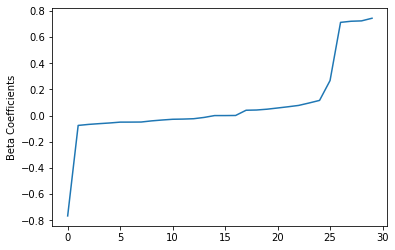

In [0]:
import matplotlib.pyplot as plt 
import numpy as np


beta = np.sort(model.coefficients)
plt.plot(beta)
plt.ylabel('Beta Coefficients')
plt.show()

In [0]:
pred.select('label', 'prediction', 'probability').show()


+-----+----------+--------------------+
|label|prediction|         probability|
+-----+----------+--------------------+
|    0|       0.0|[0.91791361537280...|
|    0|       0.0|[0.91530460922070...|
|    0|       0.0|[0.91530460922070...|
|    0|       0.0|[0.91863691140655...|
|    0|       0.0|[0.91873490831680...|
|    0|       0.0|[0.91877863349689...|
|    0|       0.0|[0.91976113600128...|
|    0|       0.0|[0.92024912070075...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
|    0|       0.0|[0.92804083796728...|
+-----+----------+--------------------+
only showing top 20 rows



In [0]:
#import numpy as np
pred_pd['probability'] = pred_pd['probability'].map(lambda x: list(x))
pred_pd['encoded_label'] = pred_pd['label'].map(lambda x: np.eye(2)[int(x)])

In [0]:
y_pred = np.array(pred_pd['probability'].tolist())
y_true = np.array(pred_pd['encoded_label'].tolist())

In [0]:
from sklearn.metrics import auc, roc_curve

fpr, tpr, threshold = roc_curve(y_score=y_pred[:,0], y_true=y_true[:,0])
auc = auc(fpr, tpr)

print('AUC: {:.3f}'.format(auc))

AUC: 0.948


<command-948490025913784>:3: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k--" (-> color='k'). The keyword argument will take precedence.
  plt.plot([0,1], [0,1], 'k--', color='orange')


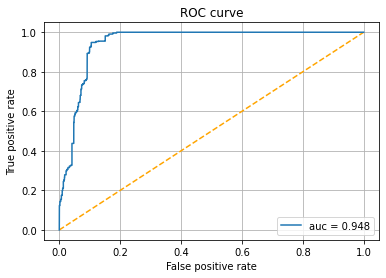

In [0]:
#import matplotlib.pyplot as plt 
plt.figure()
plt.plot([0,1], [0,1], 'k--', color='orange')
plt.plot(fpr, tpr, label='auc = {:.3f}'.format(auc))
plt.xlabel('False positive rate')
plt.ylabel('True positive rate')
plt.title('ROC curve')
plt.legend(loc='lower right')
plt.grid()
plt.show()

In [0]:
# outra forma de veriricar o valor da curva ROC
from pyspark.ml.evaluation import BinaryClassificationEvaluator
evaluator = BinaryClassificationEvaluator()
print('Test Area Under ROC', evaluator.evaluate(pred))

Test Area Under ROC 0.947590737762166


/databricks/spark/python/pyspark/sql/context.py:134: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


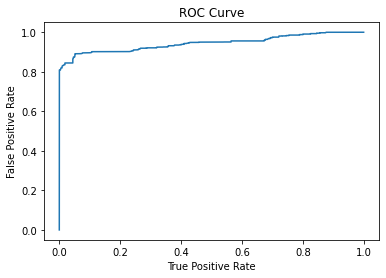

In [0]:
# mais uma forma, usando BinaryLogisticRegressionTrainingSummary

trainingSummary = model.summary 

roc = trainingSummary.roc.toPandas()
plt.plot(roc['FPR'],roc['TPR'])
plt.ylabel('False Positive Rate')
plt.xlabel('True Positive Rate')
plt.title('ROC Curve')
plt.show()



/databricks/spark/python/pyspark/sql/context.py:134: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(


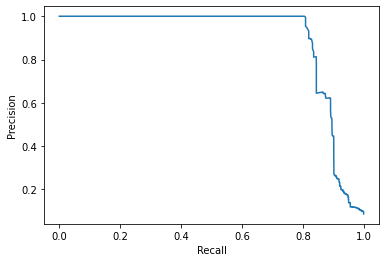

In [0]:
# precicion e recall o usando BinaryLogisticRegressionTrainingSummary
pr = trainingSummary.pr.toPandas()
plt.plot(pr['recall'],pr['precision'])
plt.ylabel('Precision')
plt.xlabel('Recall')
plt.show()

O objetio desse trabalho foi uam introdução ao databricks e ao pyspark e hive.<br>
Para trabalhos futuros, será realizado um tratamento de balanceamento dos dados, pois segundo as plotagens gráficas, há uma grande quantidade de dados de paciente que testaram negativamente e pouco do que testou positivamente. 

Além disso, a ideia é utilizar de outros algoritimos de classificação, como um random forest.